In [194]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import ast
import statistics

import os

In [151]:
output_directory = '/Users/christiancarljacob/Library/CloudStorage/OneDrive-Persönlich/Chrissi/HPI/Master/WiSe2425/SE4ML/Repo/SEwithML/David-Christian/output'
result_df = pd.DataFrame()

directory = os.fsencode(output_directory)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    
    temp_df = pd.read_csv('output/' + filename)
    temp_df['model'] = filename.split('_')[3].replace('.csv', '')
    temp_df['prompting'] = filename.split('_')[2]

    result_df = pd.concat([result_df, temp_df])

result_df = result_df.rename(columns={'Unnamed: 0': 'bug'})

In [172]:
def get_rouge_l_f_c(row):
    return ast.literal_eval(row['rouge_c'])['rouge-l']['f']
def get_rouge_l_f_d(row):
    return ast.literal_eval(row['rouge_d'])['rouge-l']['f']
def get_cosine_c(row):
    temp = row['cosine_c'].replace('[[', '').replace(']]', '').replace('1.         ', '').replace(' 1.        ', '').replace('1.        ', '').replace(' 1.       ', '').replace('1.       ', '').replace('1. ', '').replace('[', '').replace(']', '').split('\n')
    1.       
    return float(temp[0])
def get_cosine_d(row):
    temp = row['cosine_d'].replace('[[', '').replace(']]', '').replace('1.         ', '').replace(' 1.        ', '').replace('1.        ', '').replace(' 1.       ', '').replace('1.       ', '').replace('1. ', '').replace('[', '').replace(']', '').split('\n')
    return float(temp[0])

In [173]:
result_df['rouge_l_f_c'] = result_df.apply(get_rouge_l_f_c, axis=1)
result_df['rouge_l_f_d'] = result_df.apply(get_rouge_l_f_d, axis=1)
result_df['cosine_c_absolute'] = result_df.apply(get_cosine_c, axis=1)
result_df['cosine_d_absolute'] = result_df.apply(get_cosine_d, axis=1)

In [175]:
HIT01_8_df = result_df[result_df['bug'] == 'HIT01_8']
HIT02_24_df = result_df[result_df['bug'] == 'HIT02_24']
HIT03_6_df = result_df[result_df['bug'] == 'HIT03_6']
HIT04_7_df = result_df[result_df['bug'] == 'HIT04_7']
HIT05_35_df = result_df[result_df['bug'] == 'HIT05_35']
HIT06_51_df = result_df[result_df['bug'] == 'HIT06_51']
HIT07_33_df = result_df[result_df['bug'] == 'HIT07_33']
HIT08_54_df = result_df[result_df['bug'] == 'HIT08_54']

In [ ]:
df_dict = {'HIT01_8': HIT01_8_df, 'HIT02_24': HIT02_24_df, 'HIT03_6': HIT03_6_df, 'HIT04_7': HIT04_7_df, 'HIT05_35': HIT05_35_df, 'HIT06_51': HIT06_51_df, 'HIT07_33': HIT07_33_df, 'HIT08_54': HIT08_54_df}
metrics = ['bleu_c', 'bleu_d', 'readablity', 'bleurt_c', 'bleurt_d', 'rouge_l_f_c', 'rouge_l_f_d', 'cosine_c_absolute', 'cosine_d_absolute']


In [177]:
HIT01_8_df.head(3)

,bug,explanation,description_c,description_d,bleu_c,bleu_d,readablity,readablity_c,readablity_d,cosine_c,...,rouge_c,rouge_d,bleurt_c,bleurt_d,model,prompting,rouge_l_f_c,rouge_l_f_d,cosine_c_absolute,cosine_d_absolute
0,HIT01_8,The issue lies on line 279 due to the conditio...,The root cause for the thrown exception is in ...,"The specification states, that the method ""Dat...",0.009789,0.025074,54.22,55.44,44.58,[[1. 0.22219227]\n [0.22219227 1. ...,...,"{'rouge-1': {'r': 0.0, 'p': 0.0, 'f': 0.0}, 'r...","{'rouge-1': {'r': 0.0, 'p': 0.0, 'f': 0.0}, 'r...",0.459364,0.408514,deepseek-llm-7b,oneshot,0.0,0.0,0.222192,0.255794
0,HIT01_8,There are multiple issues with the provided co...,The root cause for the thrown exception is in ...,"The specification states, that the method ""Dat...",0.012396,0.027749,57.27,55.44,44.58,[[1. 0.27598945]\n [0.27598945 1. ...,...,"{'rouge-1': {'r': 0.0, 'p': 0.0, 'f': 0.0}, 'r...","{'rouge-1': {'r': 0.0, 'p': 0.0, 'f': 0.0}, 'r...",0.383651,0.352969,llama3.2-3b,source,0.0,0.0,0.275989,0.256737
0,HIT01_8,The issue is due to the condition check on lin...,The root cause for the thrown exception is in ...,"The specification states, that the method ""Dat...",0.014257,0.029691,43.02,55.44,44.58,[[1. 0.23184854]\n [0.23184854 1. ...,...,"{'rouge-1': {'r': 0.0, 'p': 0.0, 'f': 0.0}, 'r...","{'rouge-1': {'r': 0.0, 'p': 0.0, 'f': 0.0}, 'r...",0.474755,0.470029,deepseek-llm-7b,source,0.0,0.0,0.231849,0.282002


In [ ]:

for bug in df_dict:
    ax = df_dict[bug].boxplot(column=['bleurt_c', 'bleurt_d'], by='model')
    plt.tight_layout()
    plt.xticks(rotation=90)
    plt.title(bug)
    plt.show()

In [ ]:
sns.boxplot(x=HIT01_8_df['model'], y=HIT01_8_df['bleurt_c'], hue=HIT01_8_df['prompting'])
plt.xticks(rotation=90)
plt.show()

In [ ]:

for bug in df_dict:
    sns.boxplot(x=df_dict[bug]['model'], y=df_dict[bug]['bleurt_c'], hue=df_dict[bug]['prompting'])
    plt.xticks(rotation=90)
    plt.title(bug + ' Christian')
    plt.show()
for bug in df_dict:
    sns.boxplot(x=df_dict[bug]['model'], y=df_dict[bug]['bleurt_d'], hue=df_dict[bug]['prompting'])
    plt.xticks(rotation=90)
    plt.title(bug + ' David')
    plt.show()

HIT01_8
bleu_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

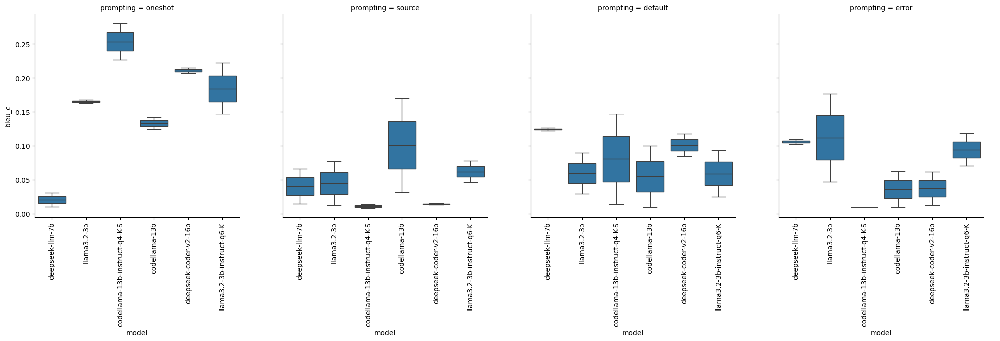

HIT02_24
bleu_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

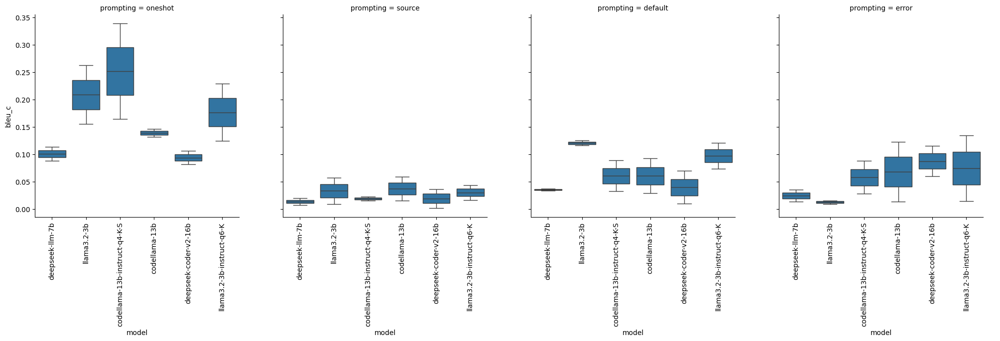

HIT03_6
bleu_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

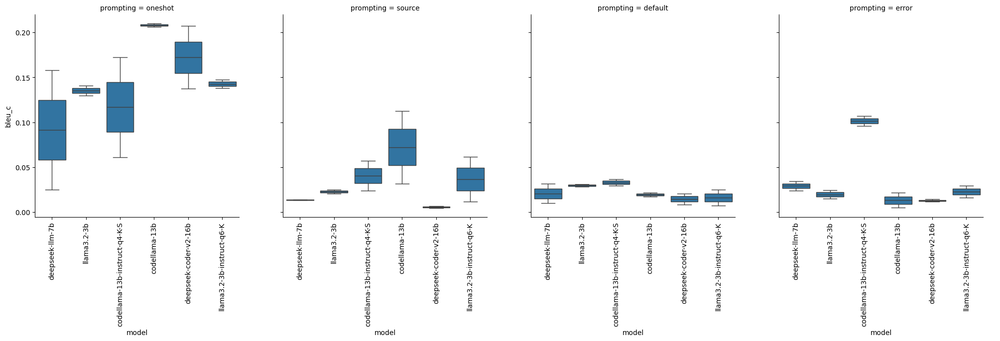

HIT04_7
bleu_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

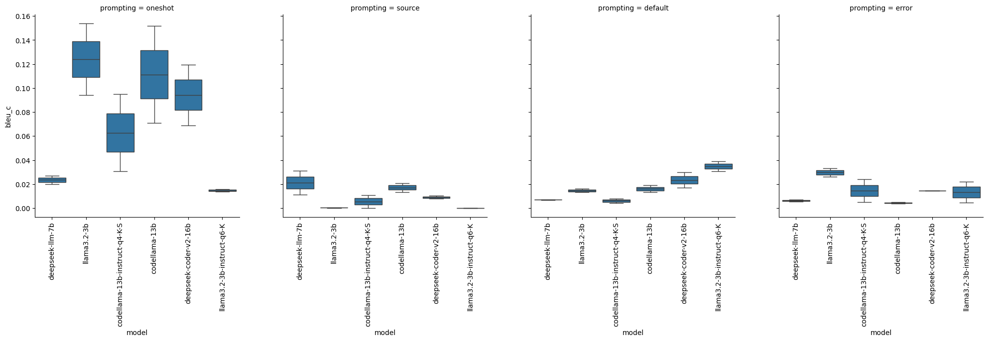

HIT05_35
bleu_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

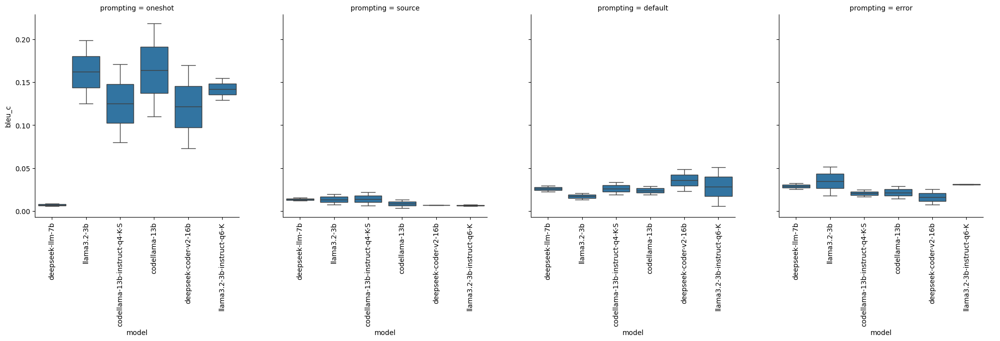

HIT06_51
bleu_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

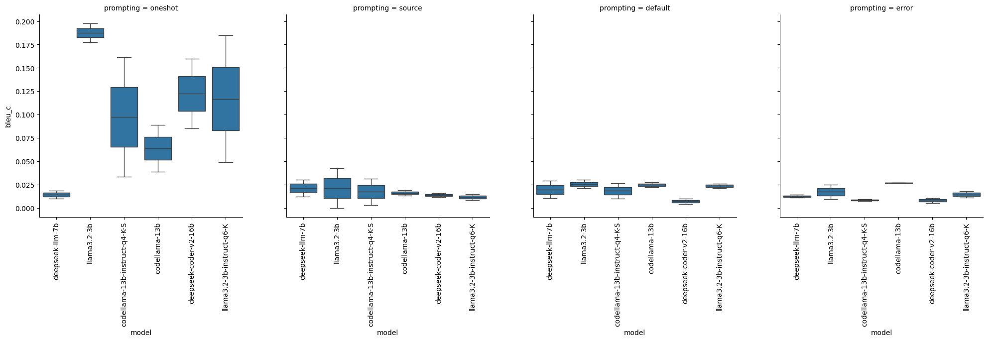

HIT07_33
bleu_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

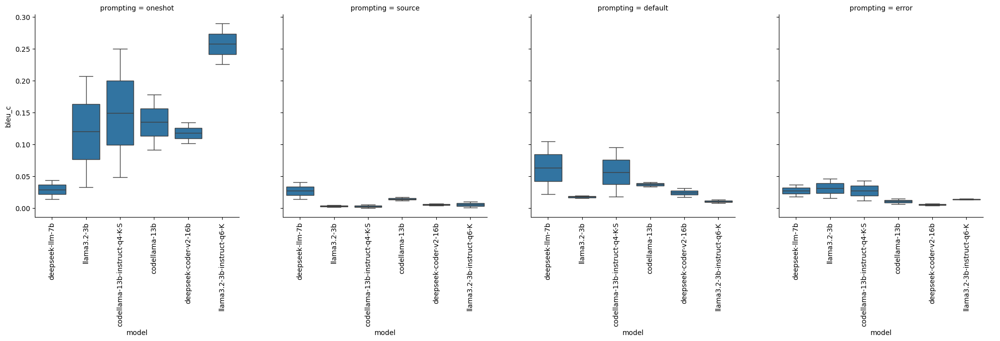

HIT08_54
bleu_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

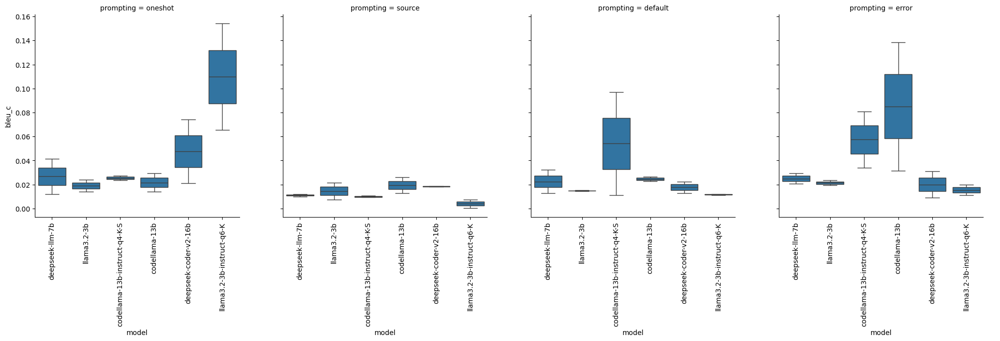

HIT01_8
bleu_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

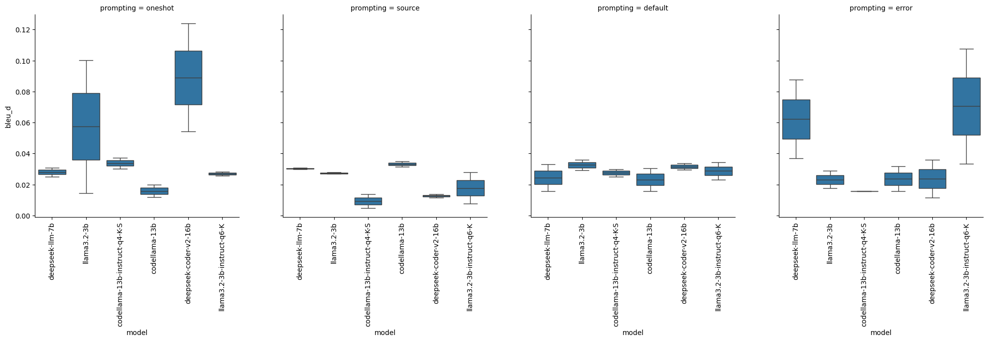

HIT02_24
bleu_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

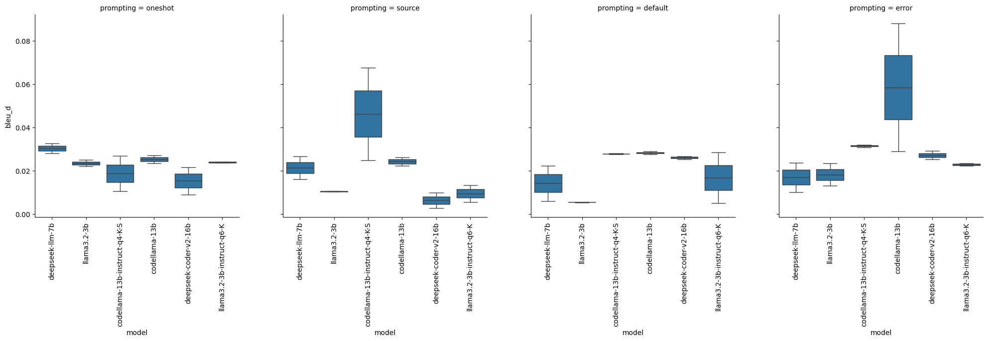

HIT03_6
bleu_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

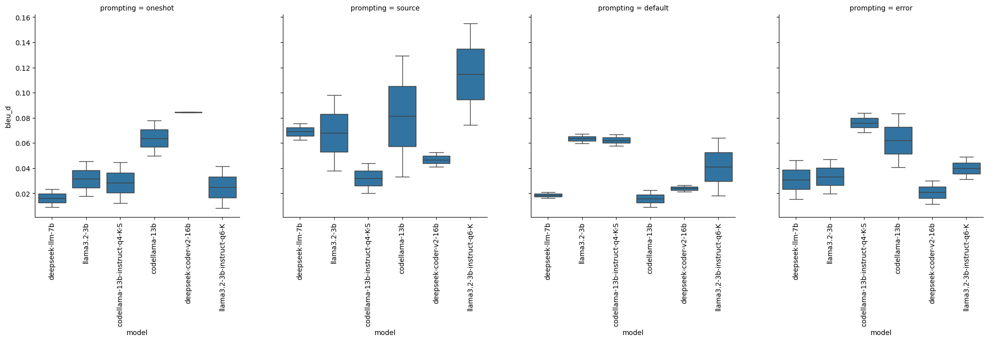

HIT04_7
bleu_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

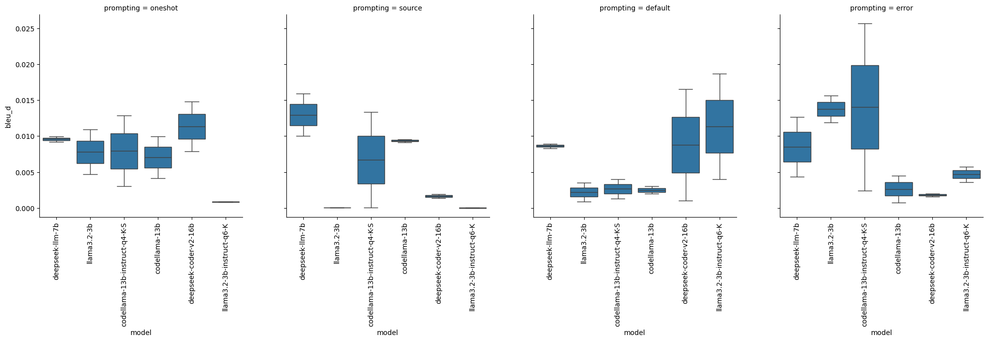

HIT05_35
bleu_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

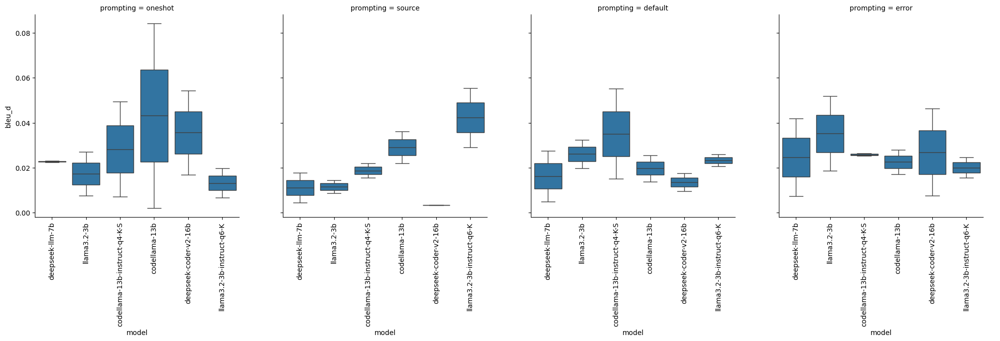

HIT06_51
bleu_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

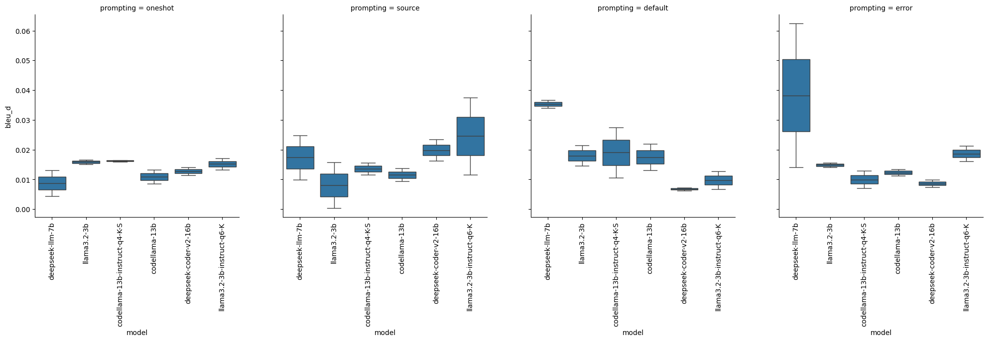

HIT07_33
bleu_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

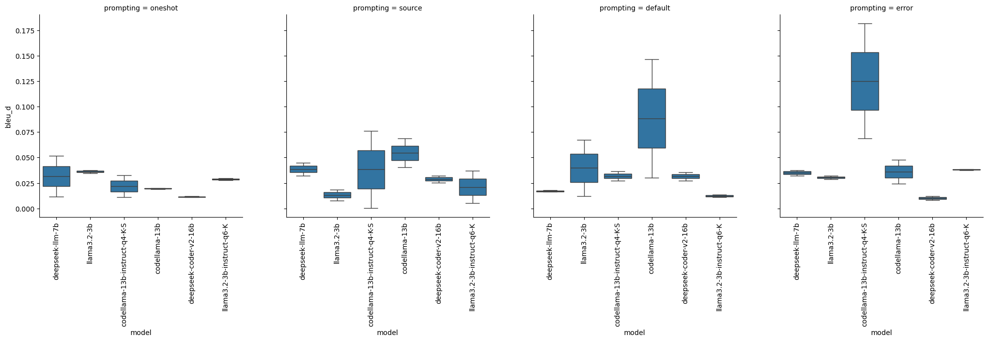

HIT08_54
bleu_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

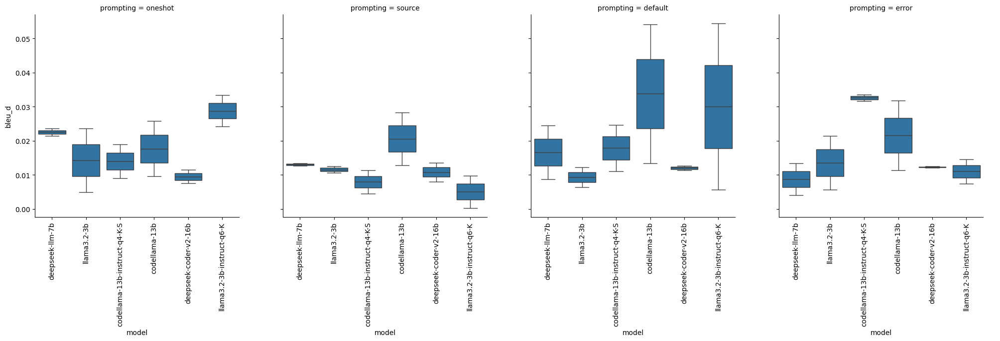

HIT01_8
readablity


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

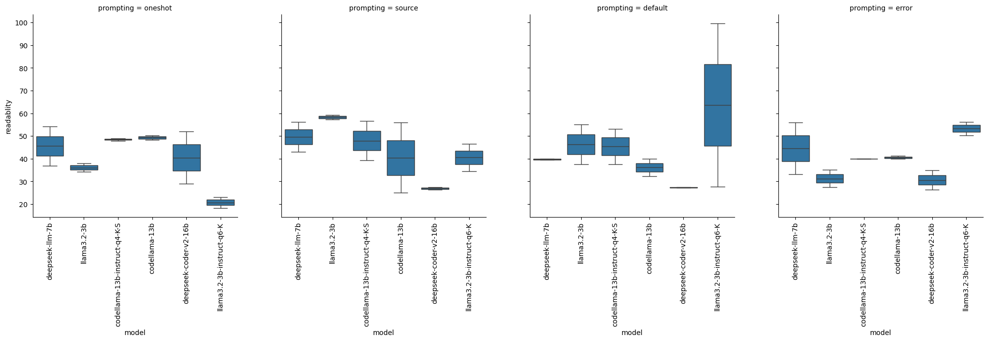

HIT02_24
readablity


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

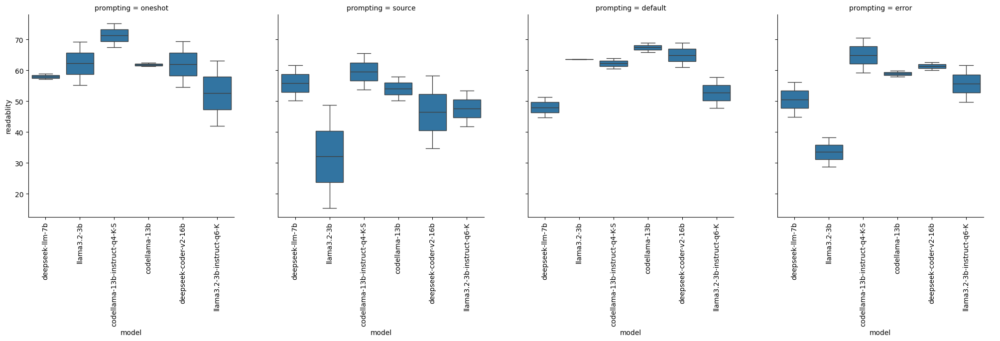

HIT03_6
readablity


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

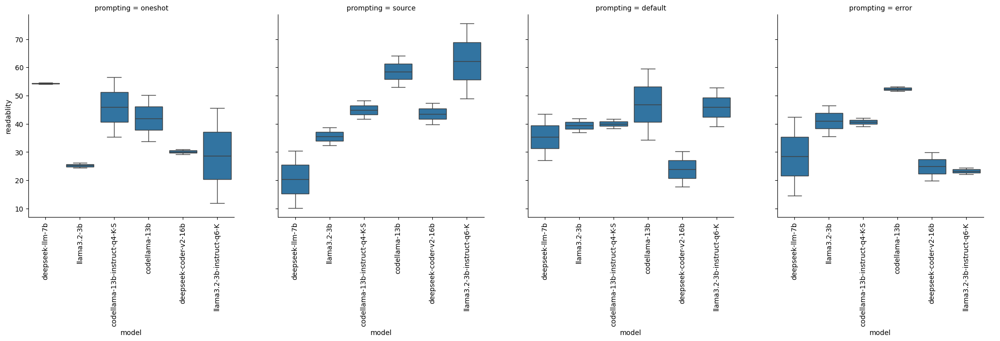

HIT04_7
readablity


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

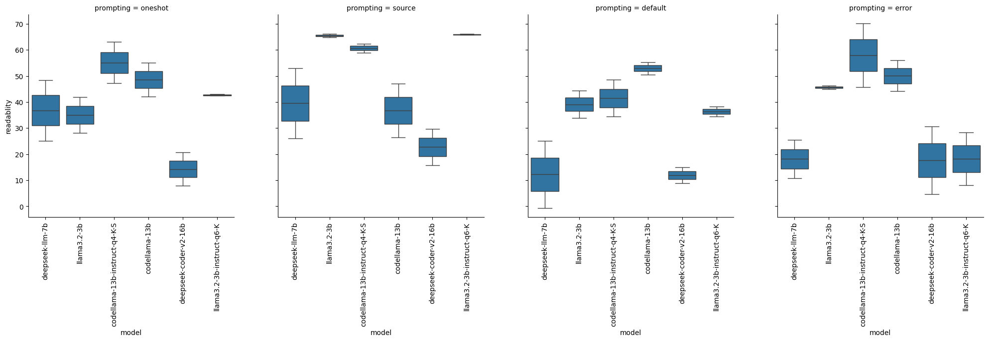

HIT05_35
readablity


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

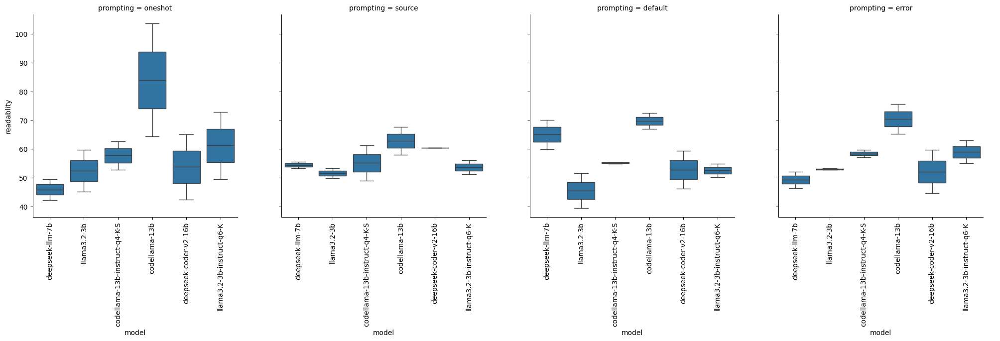

HIT06_51
readablity


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

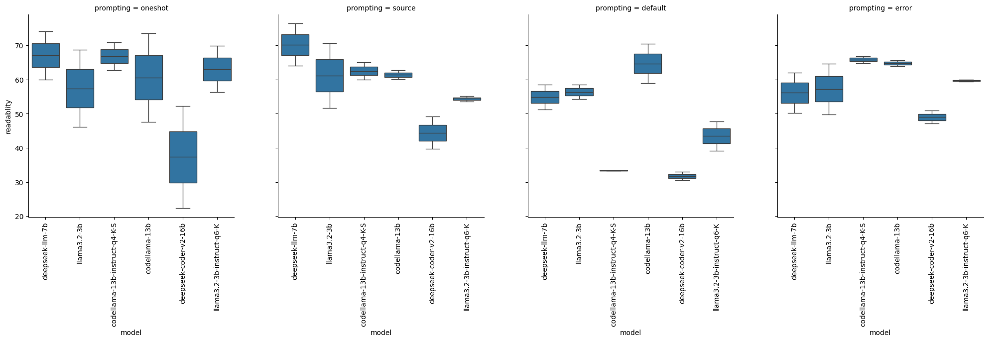

HIT07_33
readablity


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

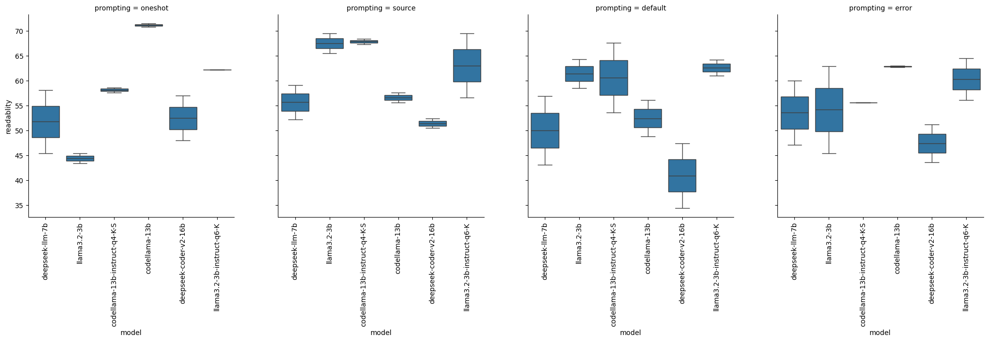

HIT08_54
readablity


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

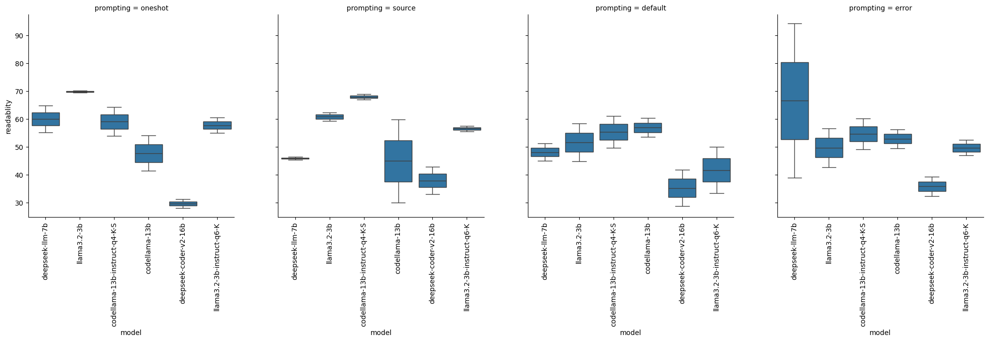

HIT01_8
bleurt_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

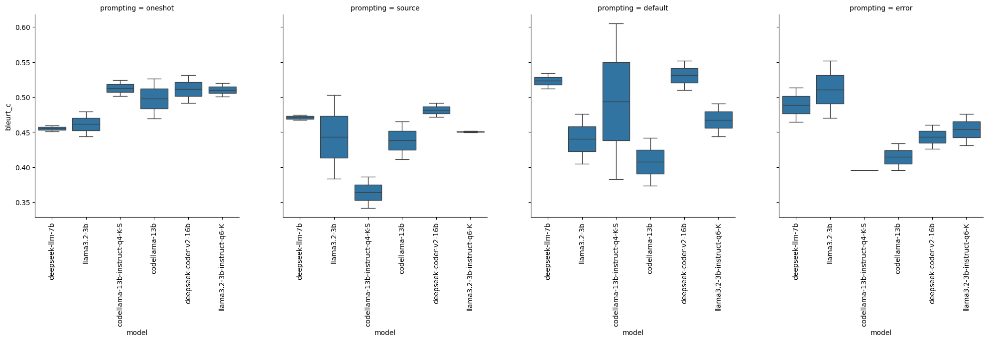

HIT02_24
bleurt_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

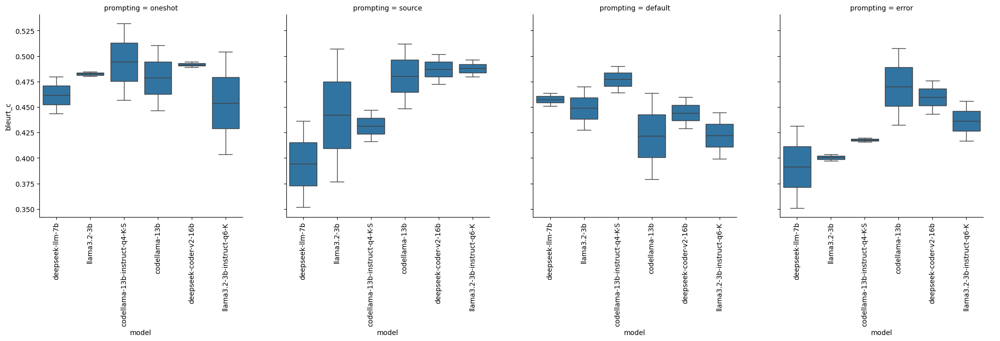

HIT03_6
bleurt_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

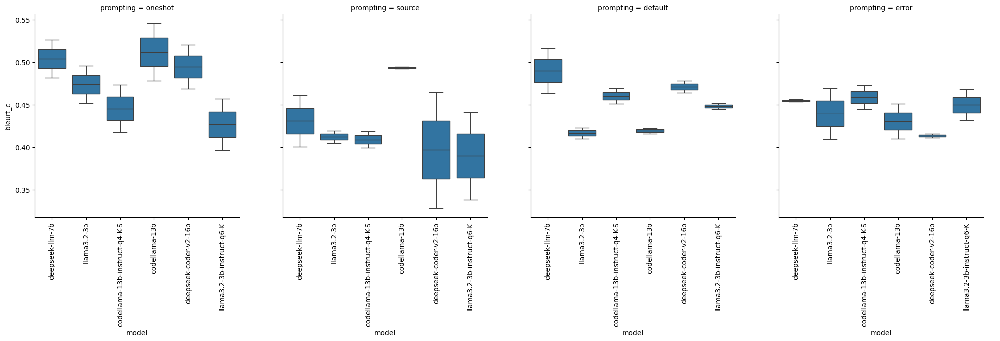

HIT04_7
bleurt_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

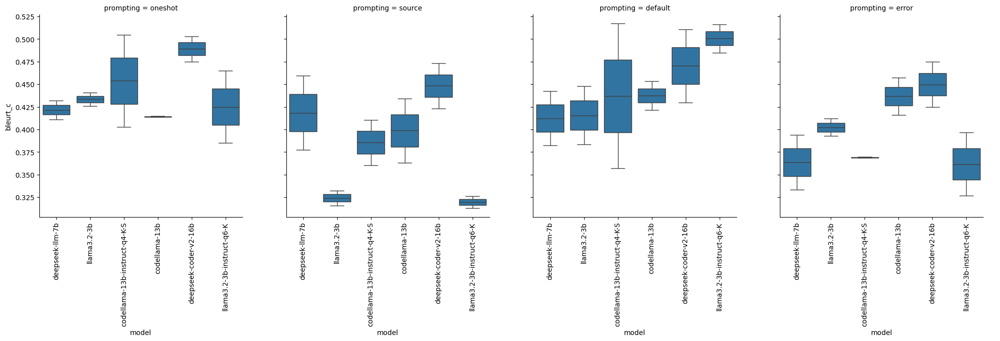

HIT05_35
bleurt_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

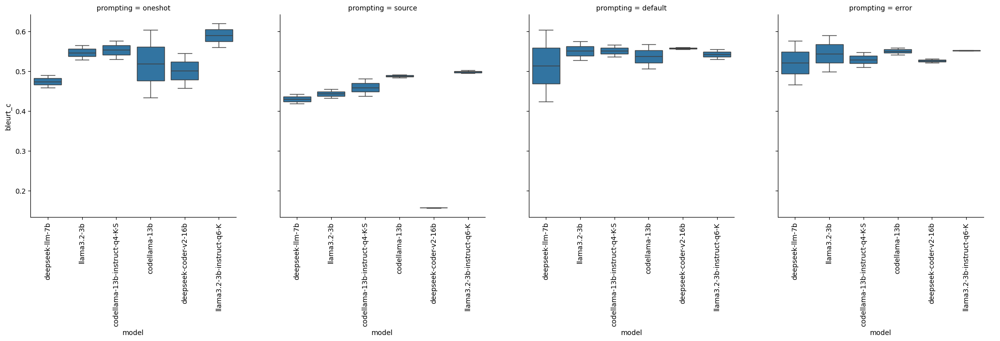

HIT06_51
bleurt_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

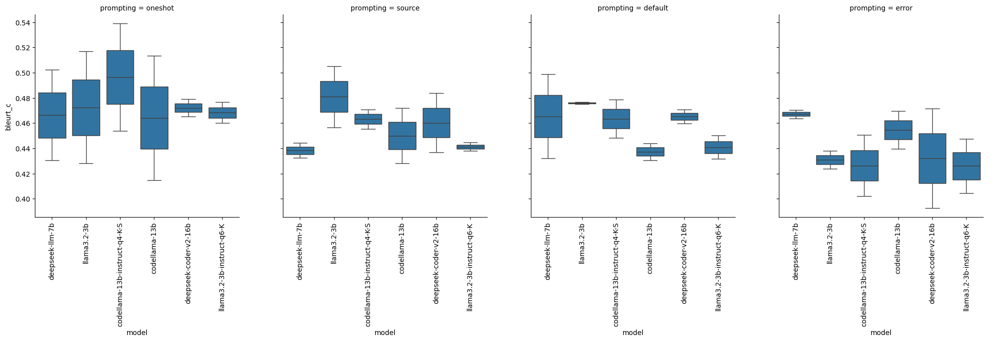

HIT07_33
bleurt_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

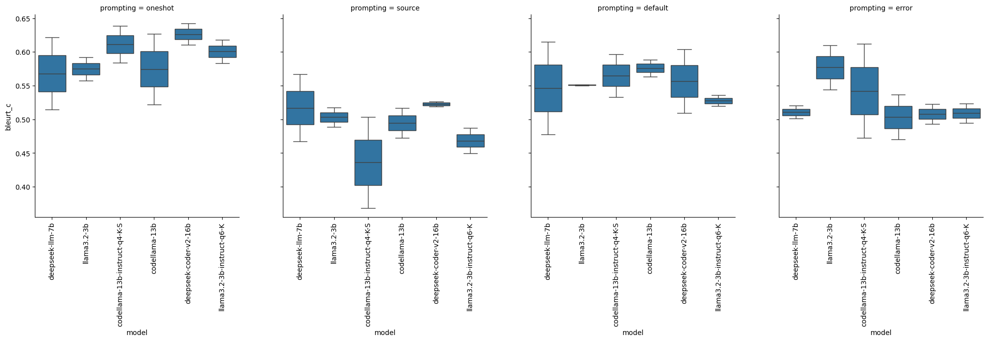

HIT08_54
bleurt_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

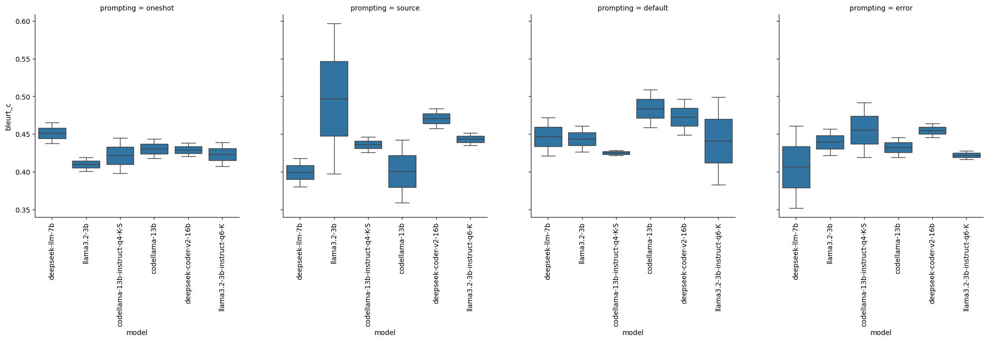

HIT01_8
bleurt_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

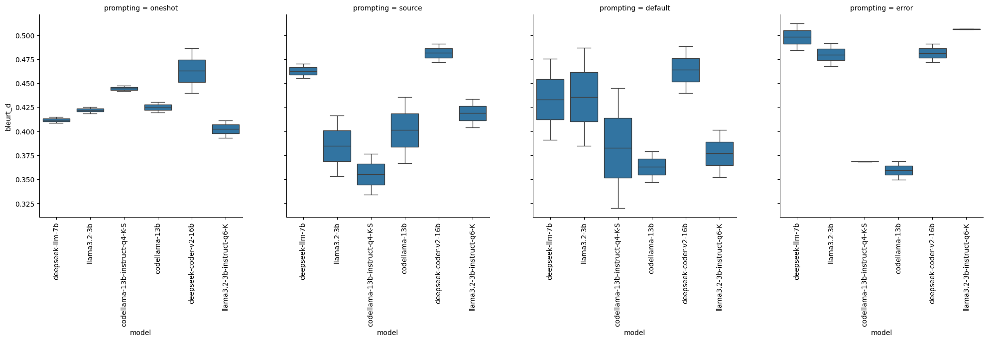

HIT02_24
bleurt_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

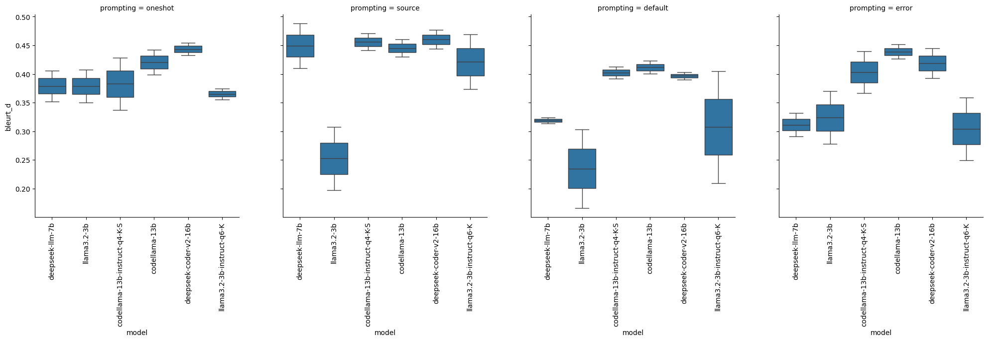

HIT03_6
bleurt_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

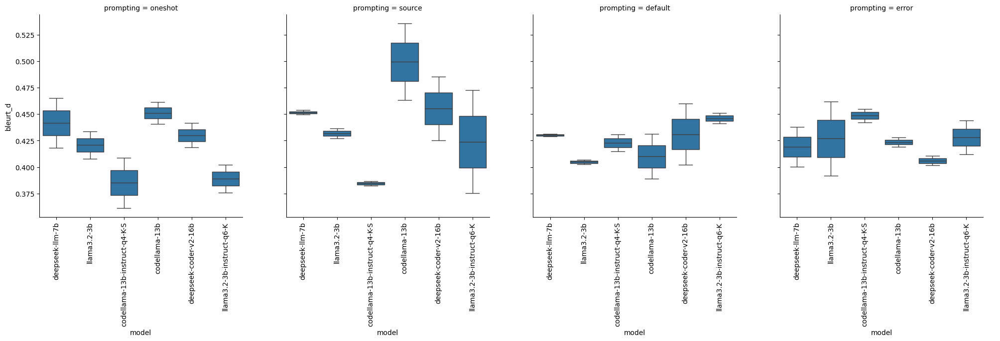

HIT04_7
bleurt_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

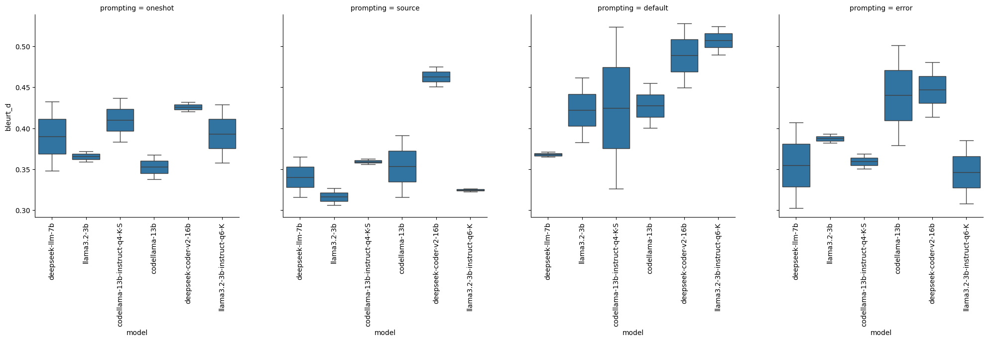

HIT05_35
bleurt_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

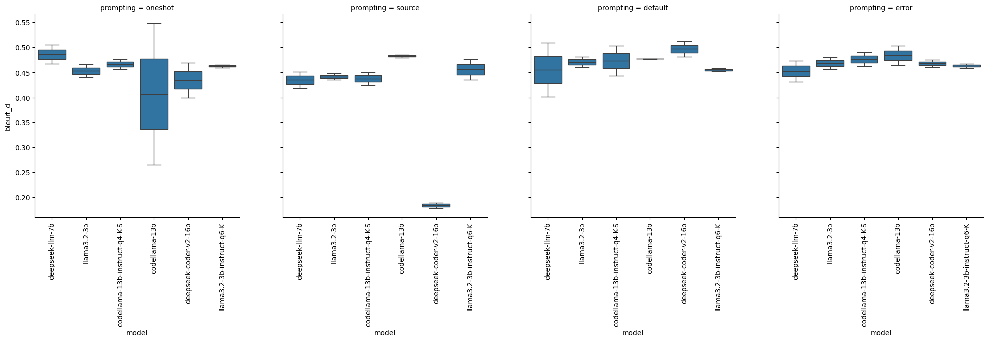

HIT06_51
bleurt_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

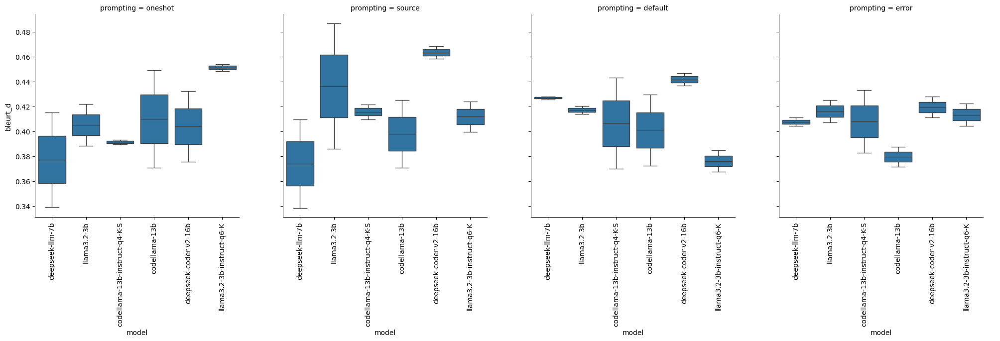

HIT07_33
bleurt_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

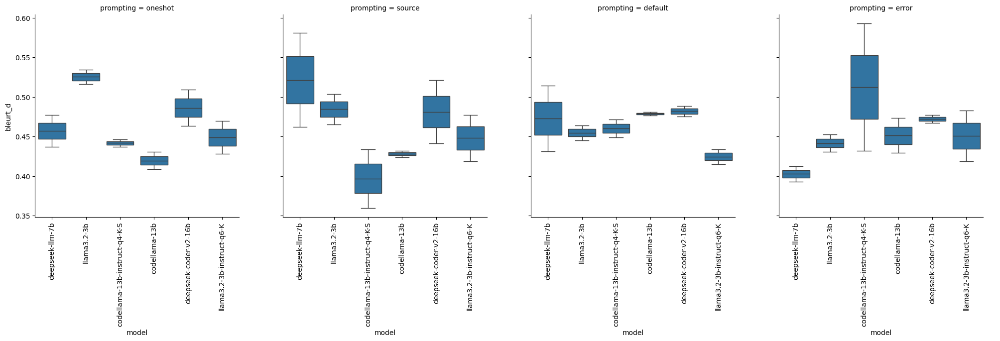

HIT08_54
bleurt_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

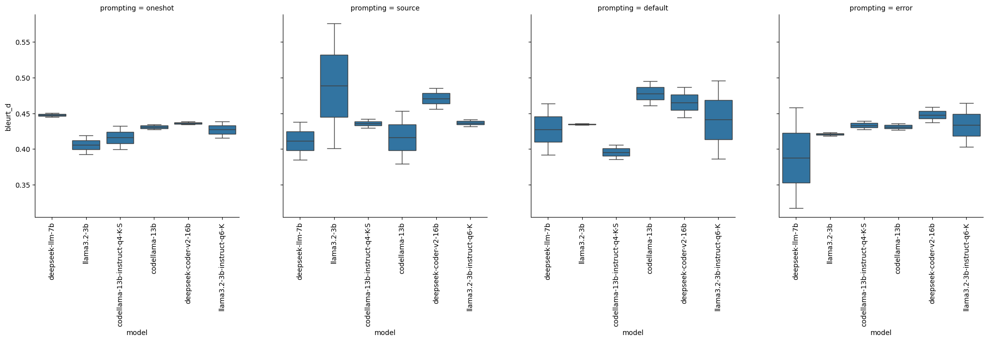

HIT01_8
rouge_l_f_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

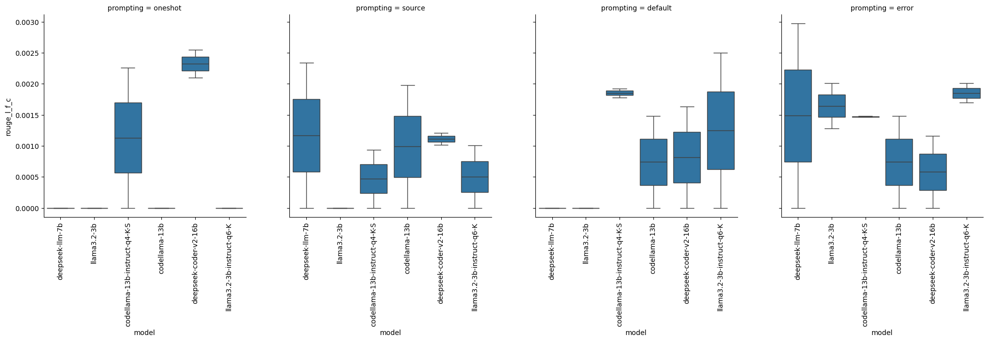

HIT02_24
rouge_l_f_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

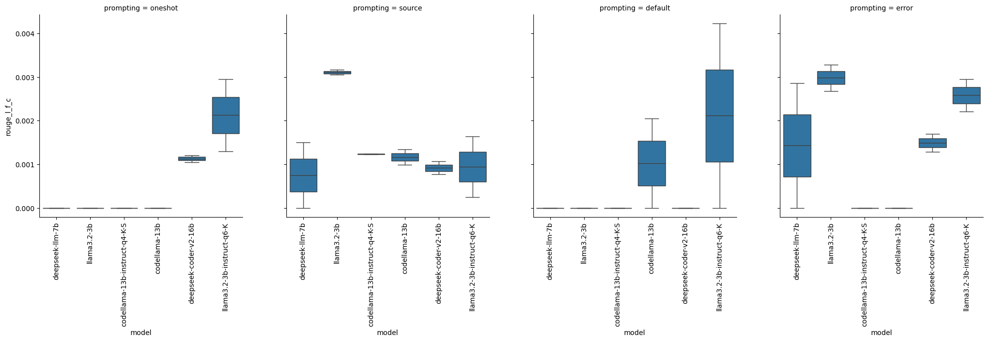

HIT03_6
rouge_l_f_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

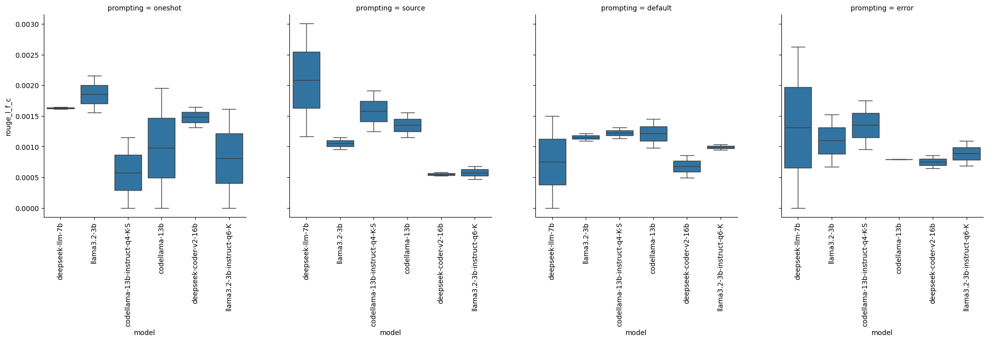

HIT04_7
rouge_l_f_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

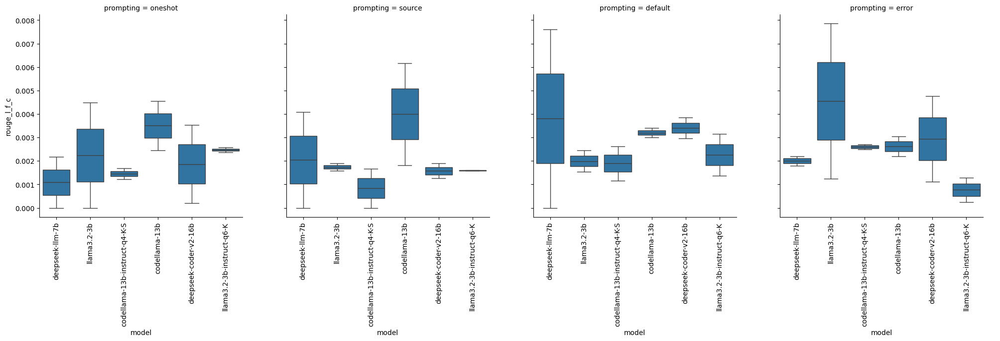

HIT05_35
rouge_l_f_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

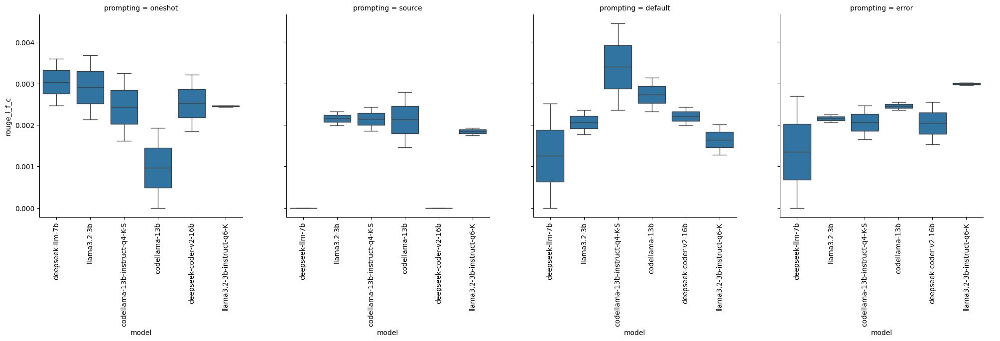

HIT06_51
rouge_l_f_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

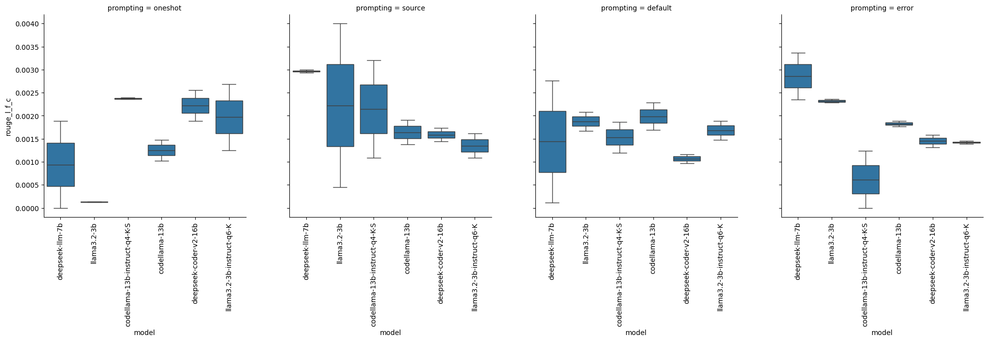

HIT07_33
rouge_l_f_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

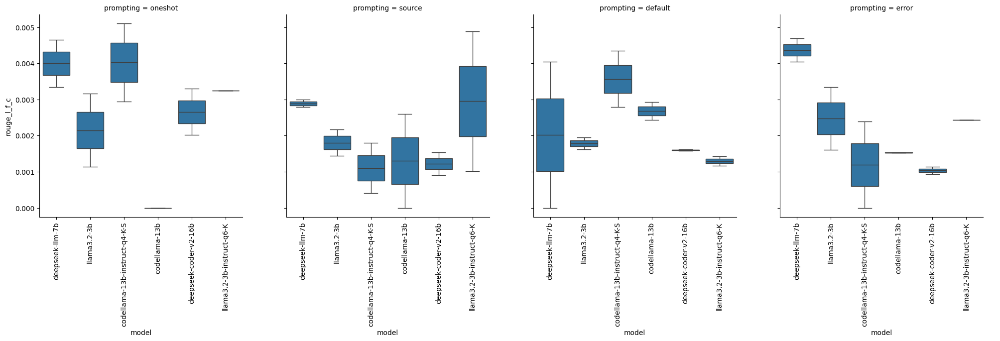

HIT08_54
rouge_l_f_c


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

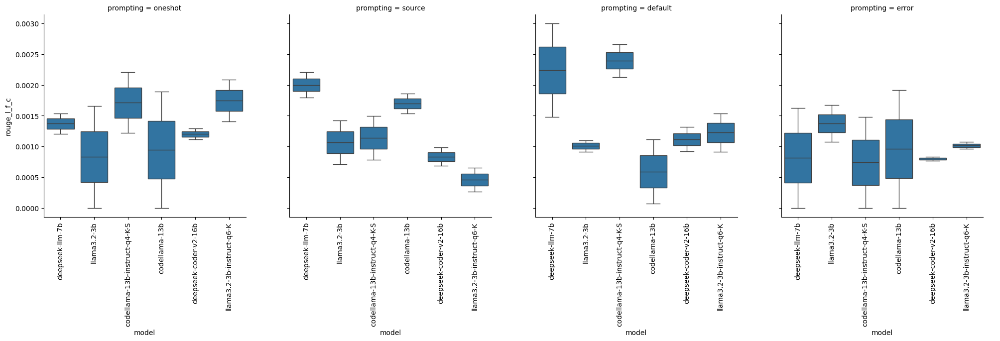

HIT01_8
rouge_l_f_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

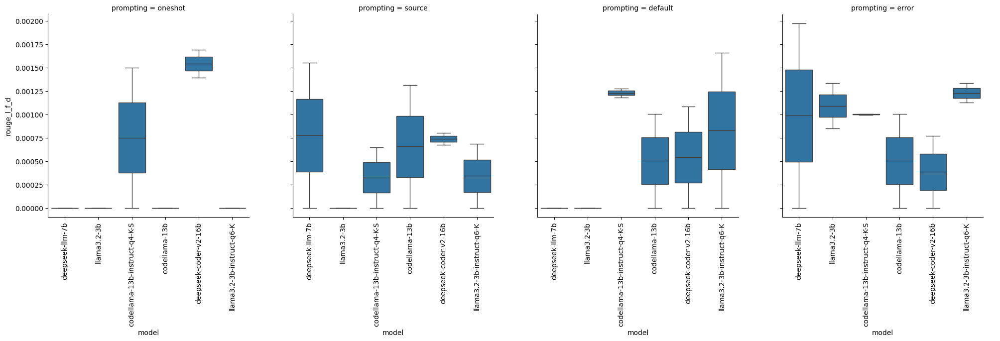

HIT02_24
rouge_l_f_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

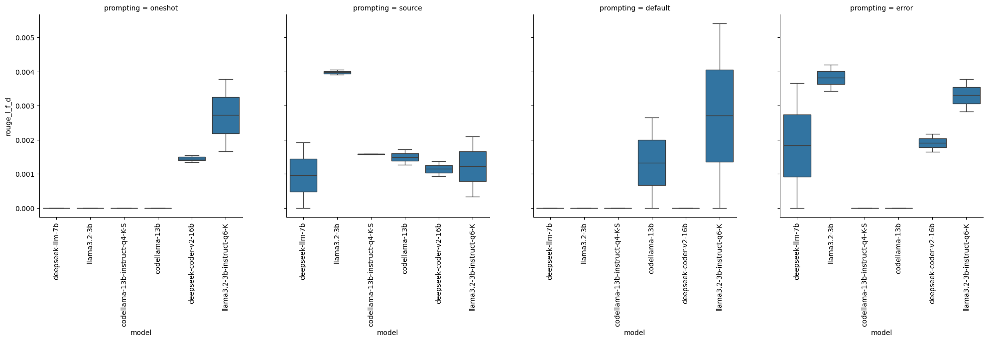

HIT03_6
rouge_l_f_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

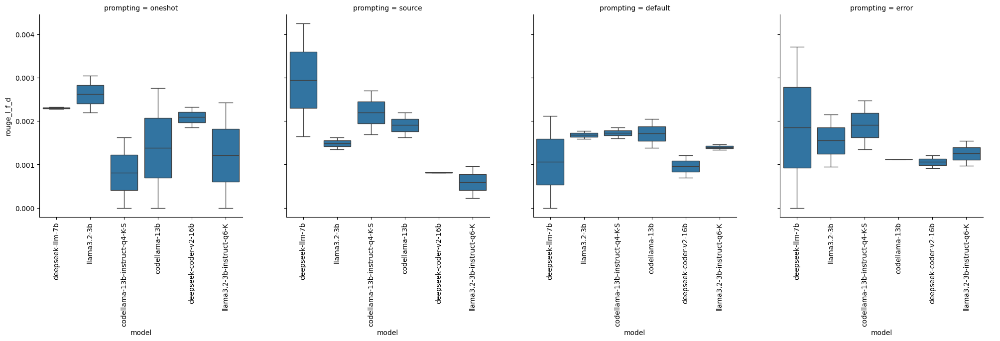

HIT04_7
rouge_l_f_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

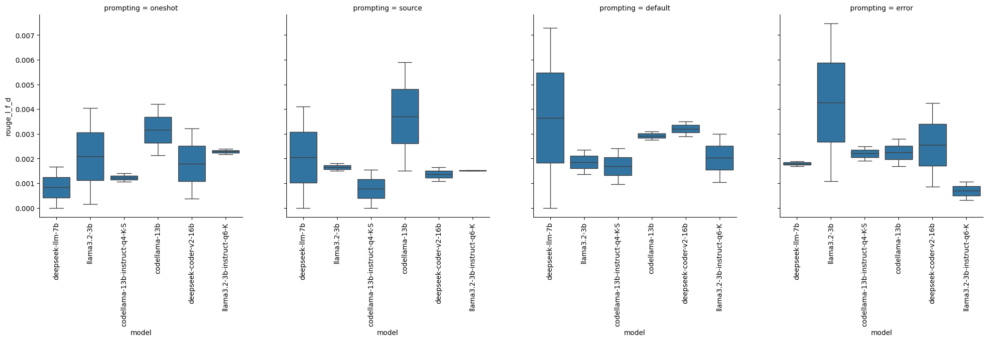

HIT05_35
rouge_l_f_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

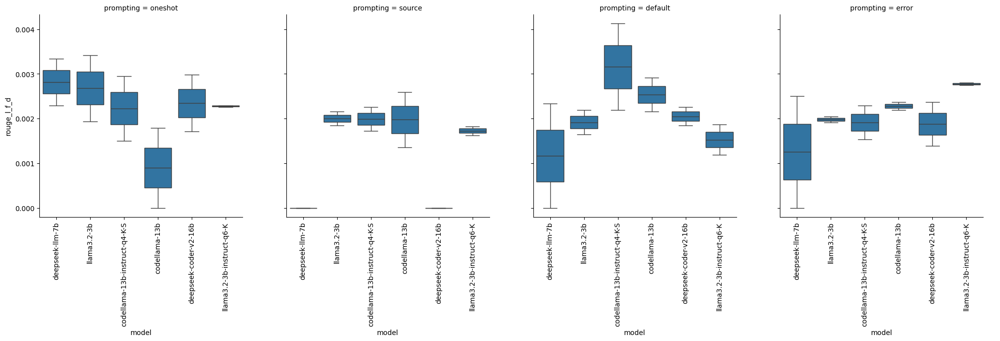

HIT06_51
rouge_l_f_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

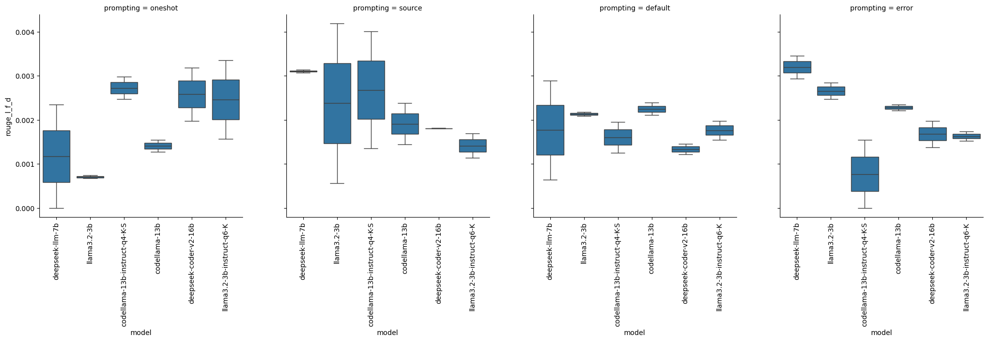

HIT07_33
rouge_l_f_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

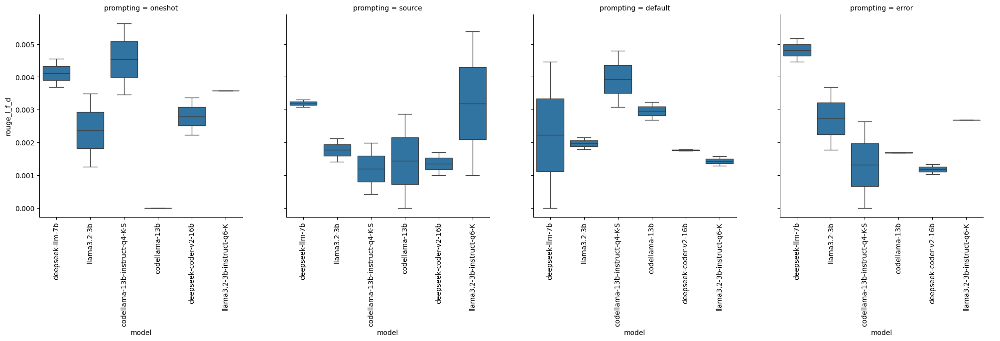

HIT08_54
rouge_l_f_d


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

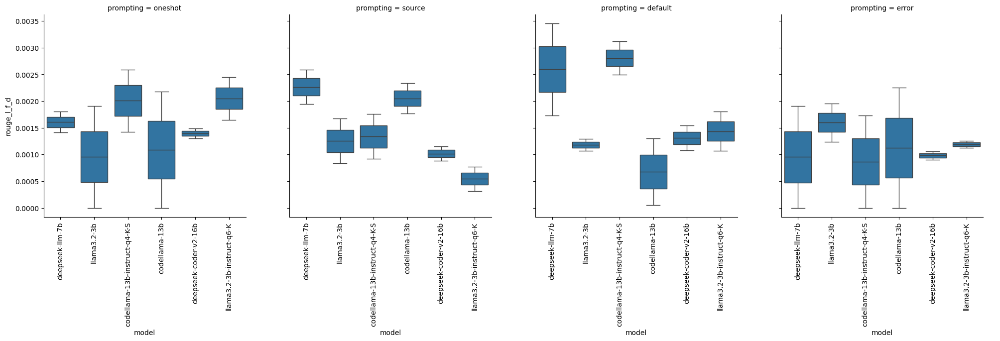

HIT01_8
cosine_c_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

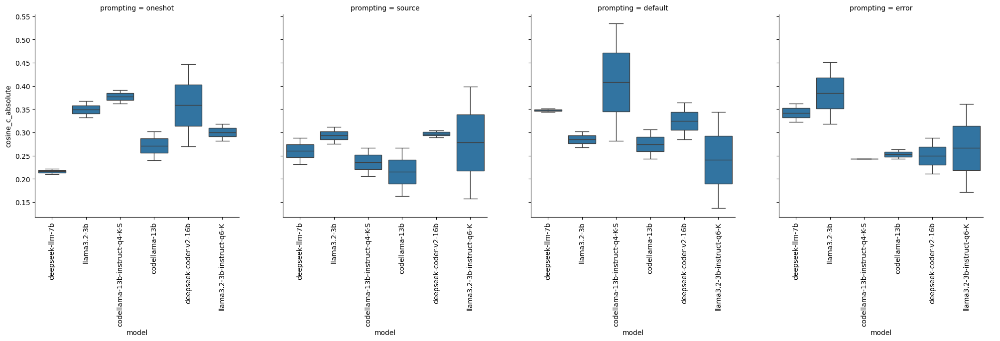

HIT02_24
cosine_c_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

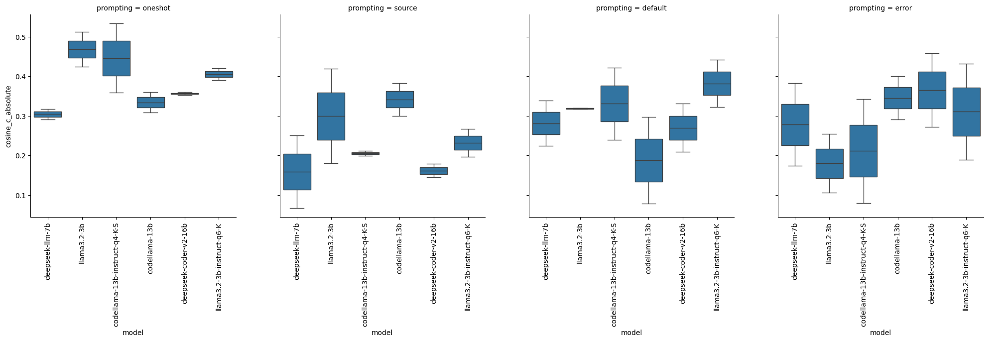

HIT03_6
cosine_c_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

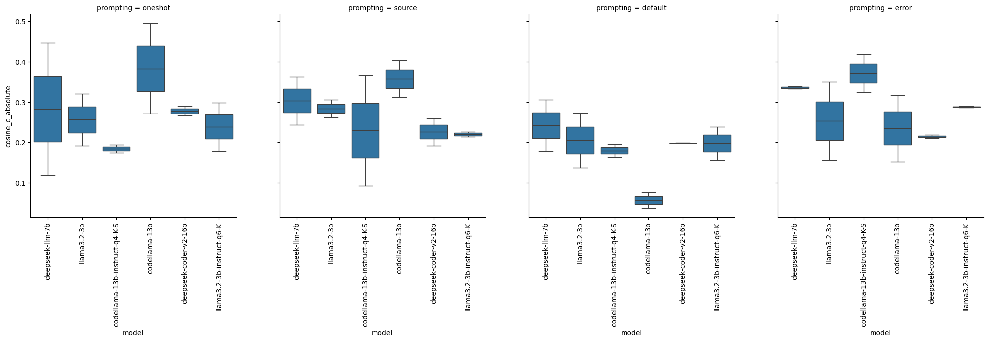

HIT04_7
cosine_c_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

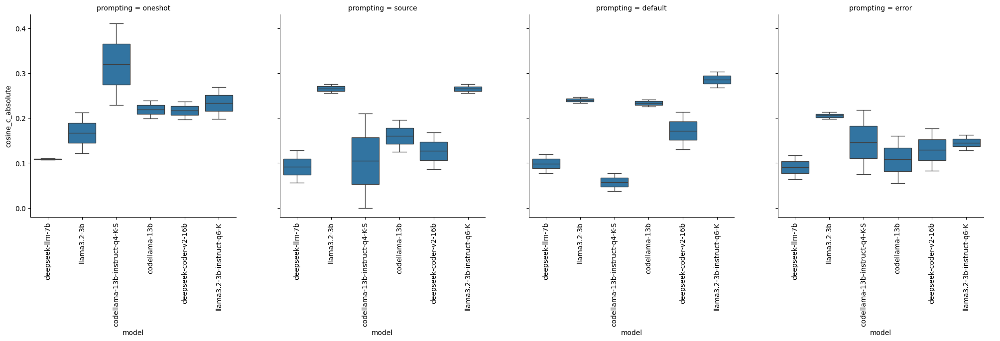

HIT05_35
cosine_c_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

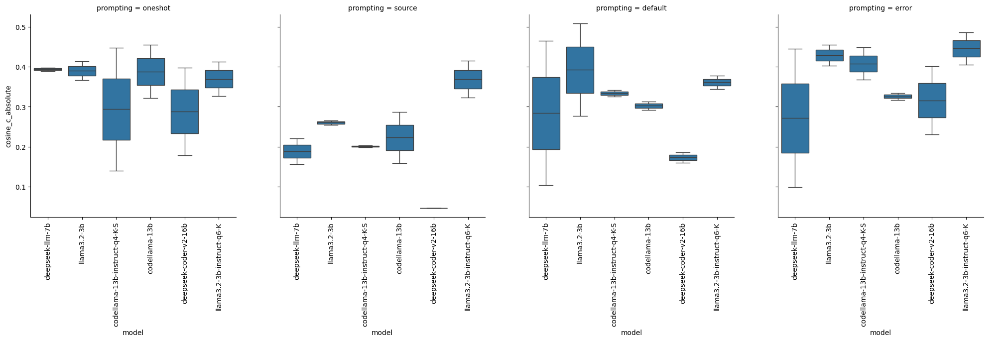

HIT06_51
cosine_c_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

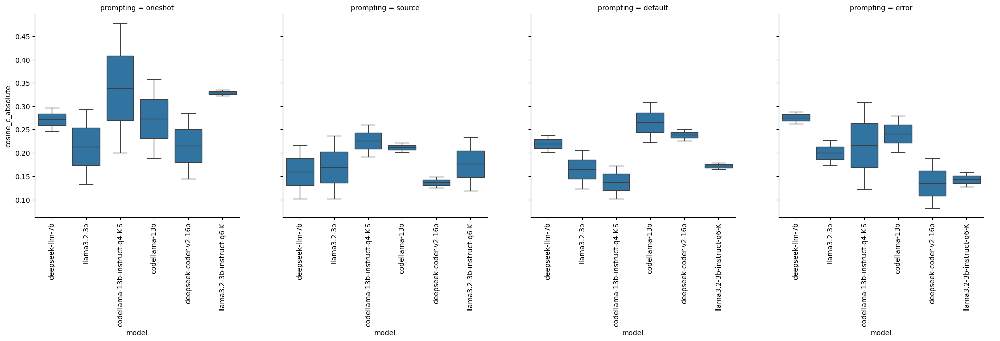

HIT07_33
cosine_c_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

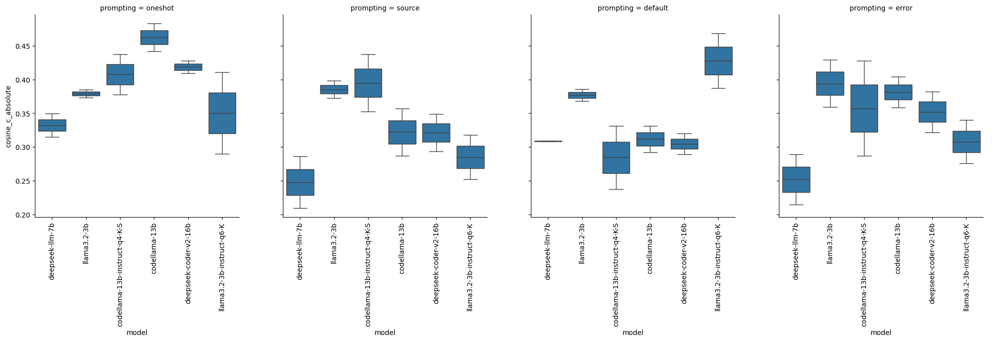

HIT08_54
cosine_c_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

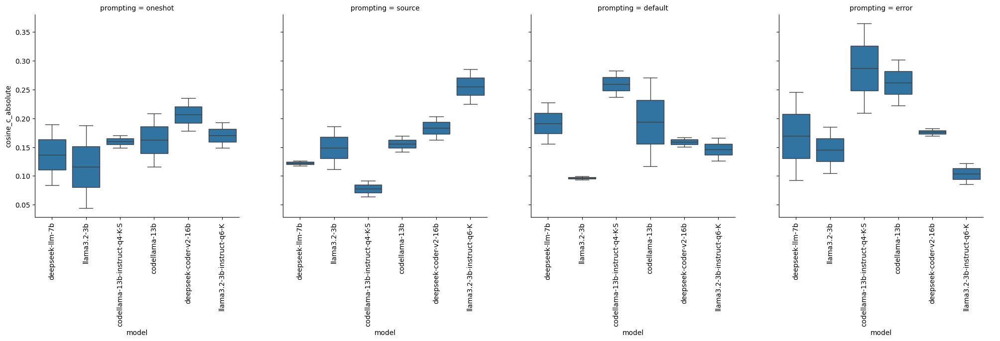

HIT01_8
cosine_d_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

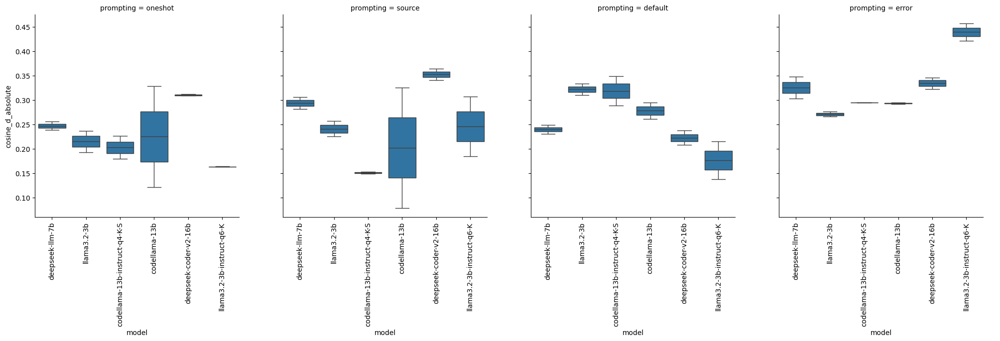

HIT02_24
cosine_d_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

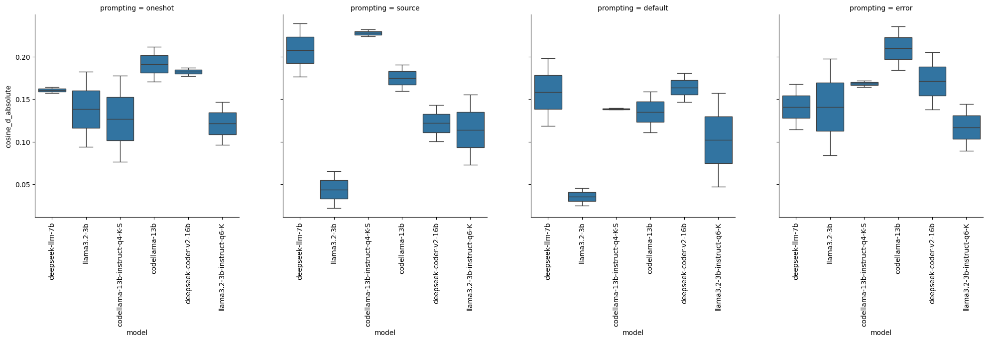

HIT03_6
cosine_d_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

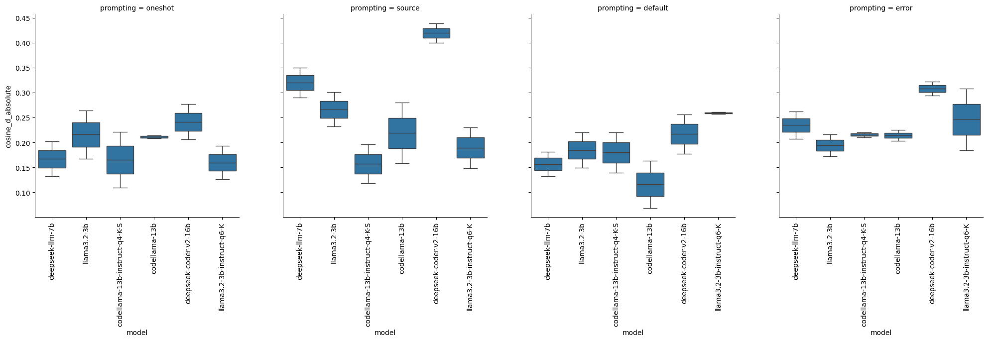

HIT04_7
cosine_d_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

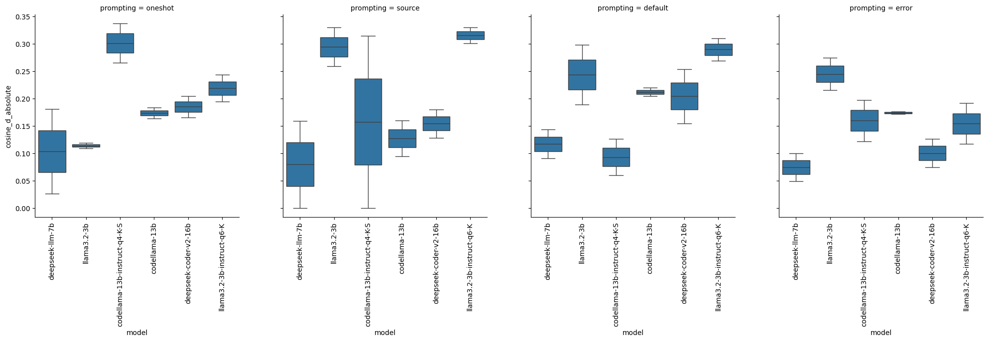

HIT05_35
cosine_d_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

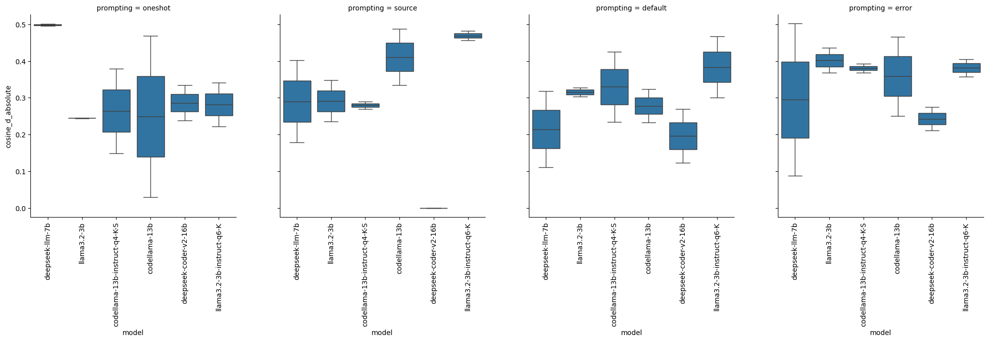

HIT06_51
cosine_d_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

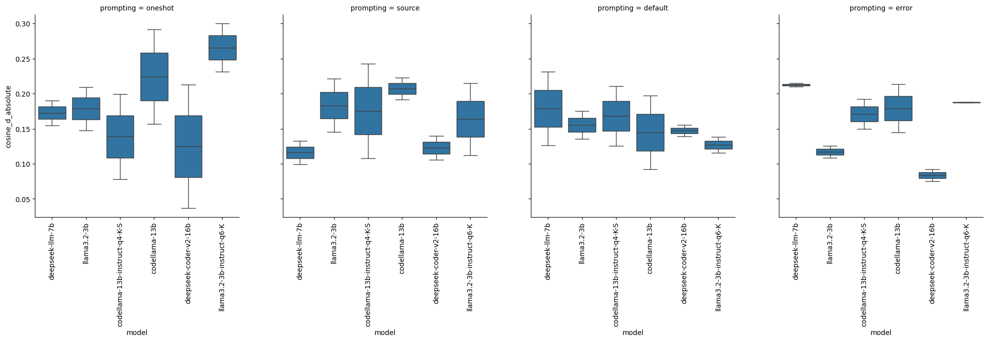

HIT07_33
cosine_d_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

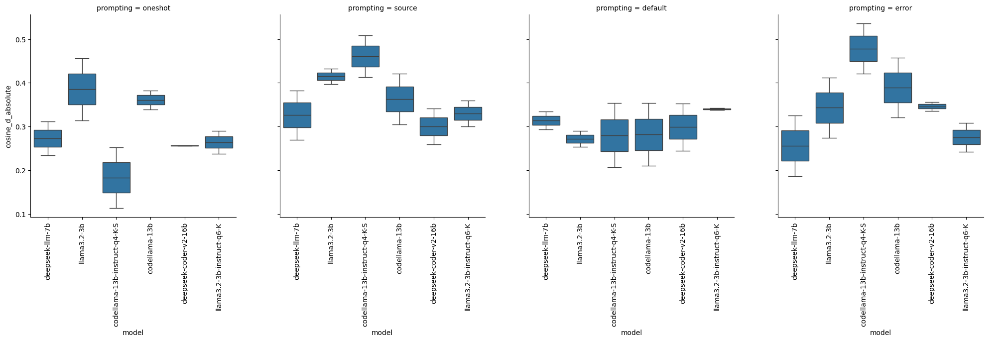

HIT08_54
cosine_d_absolute


/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/36/2qtcl0jx6r94h6345h20r6880000gn/T/ipykernel_21226/1716573683.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

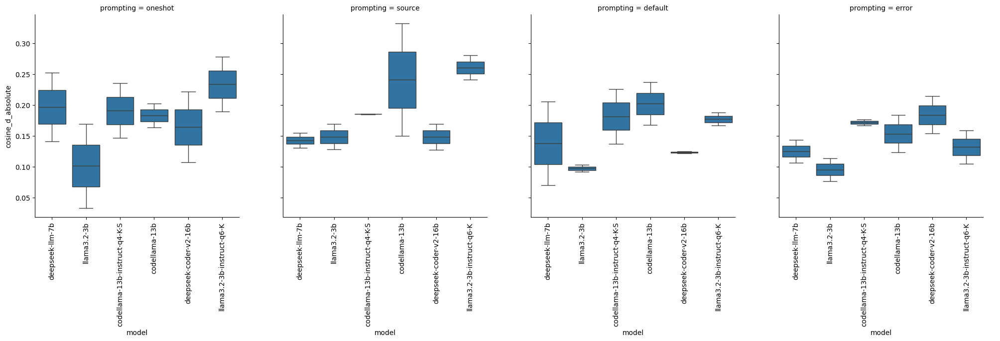

In [187]:
for m in metrics:
    for bug in df_dict:
        print(bug)
        print(m)
        g = sns.catplot(data=df_dict[bug], x=df_dict[bug]['model'], y=df_dict[bug][m], col=df_dict[bug]['prompting'], kind='box')
        for ax in g.axes.flat:
            ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
        # plt.xticks(rotation=90)
        plt.show()

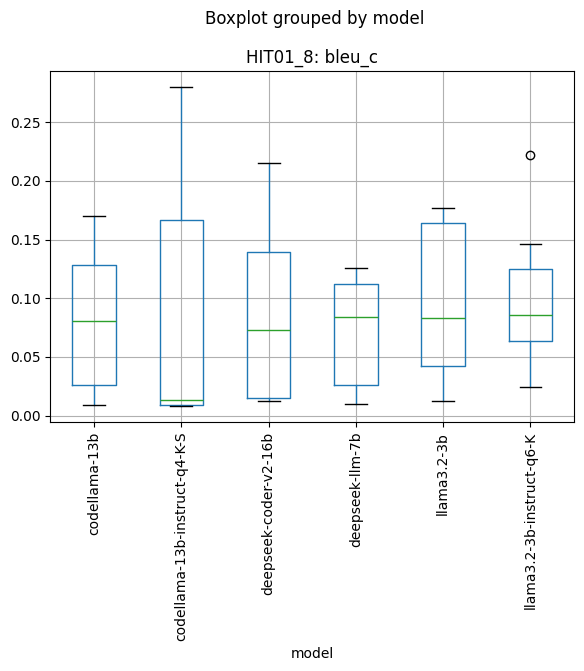

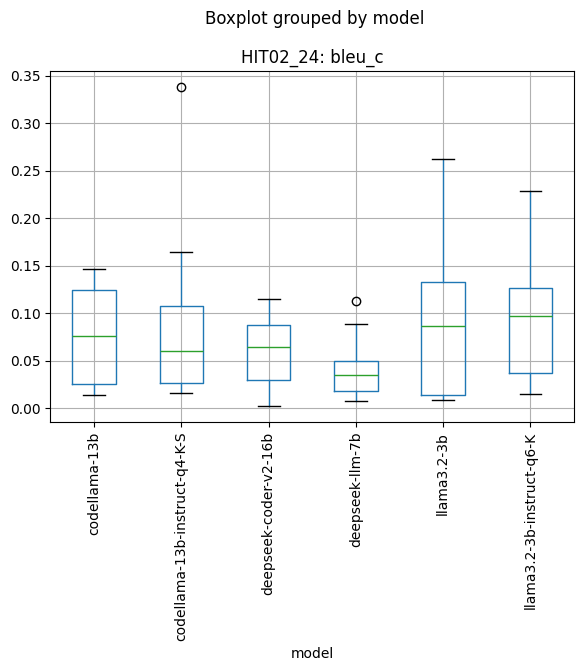

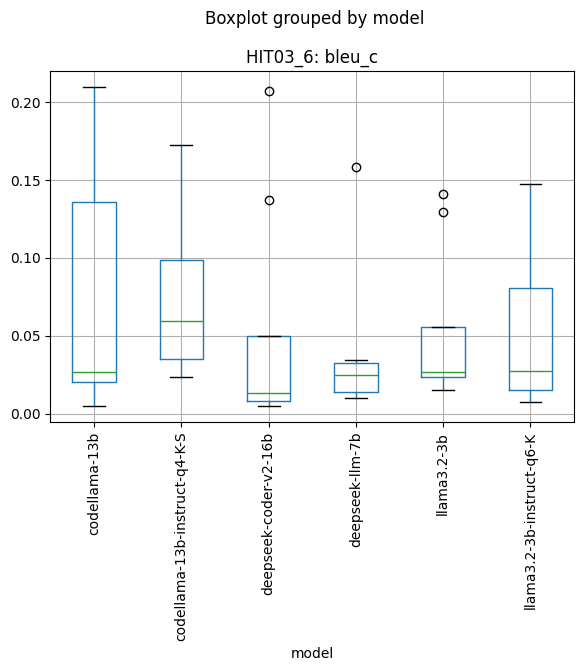

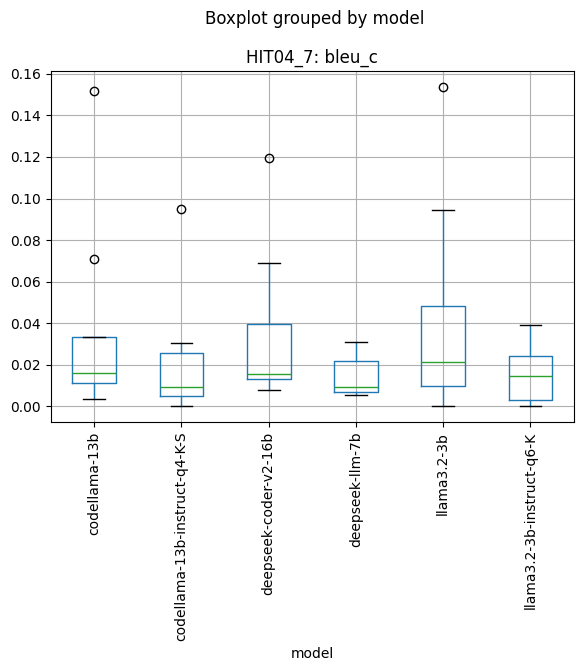

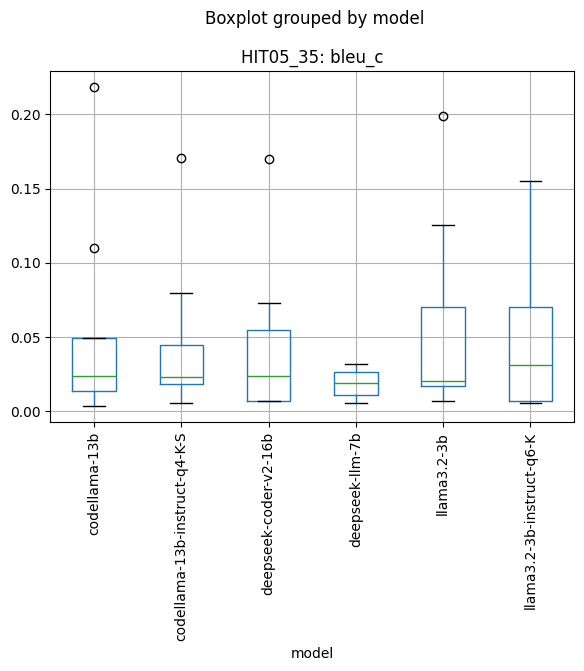

...

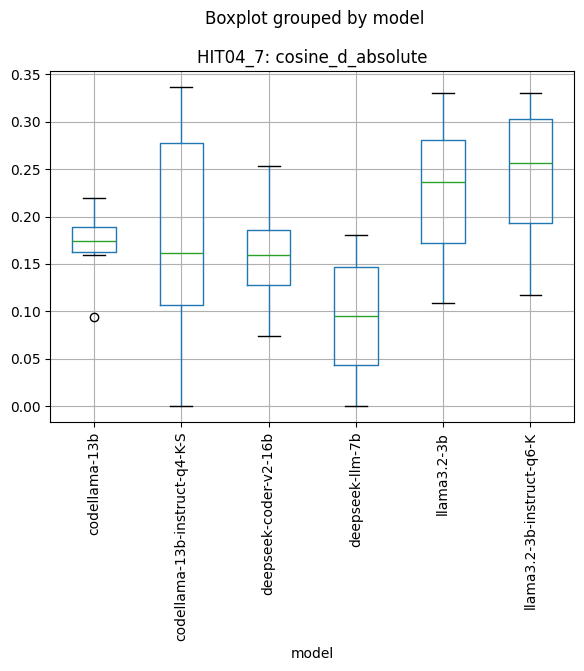

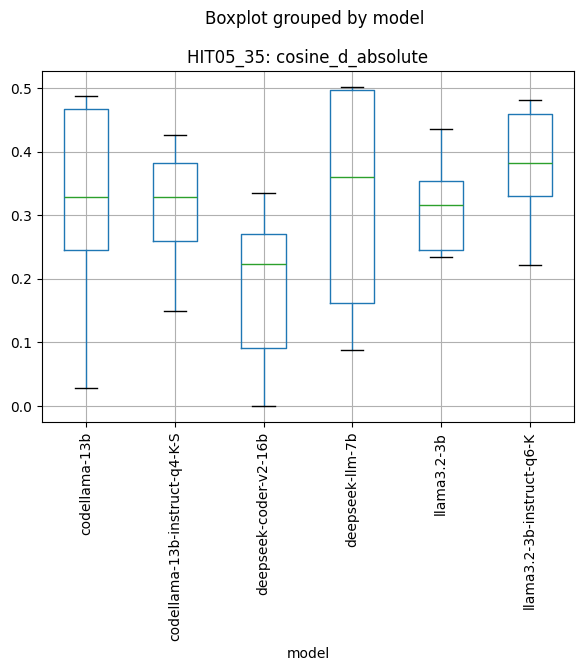

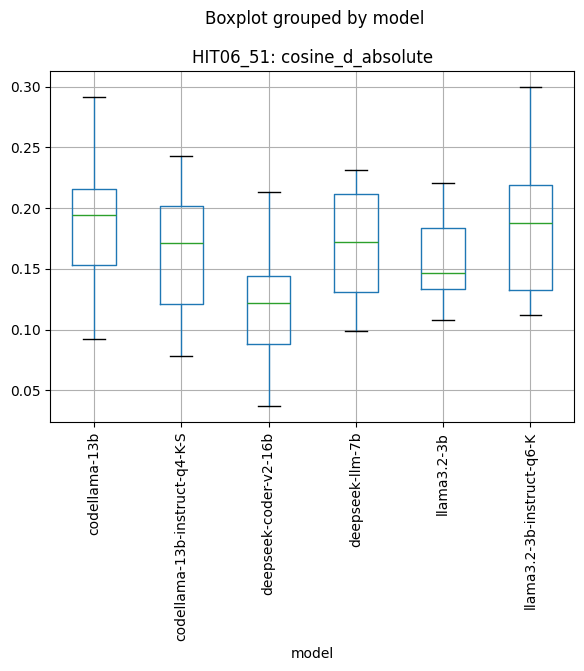

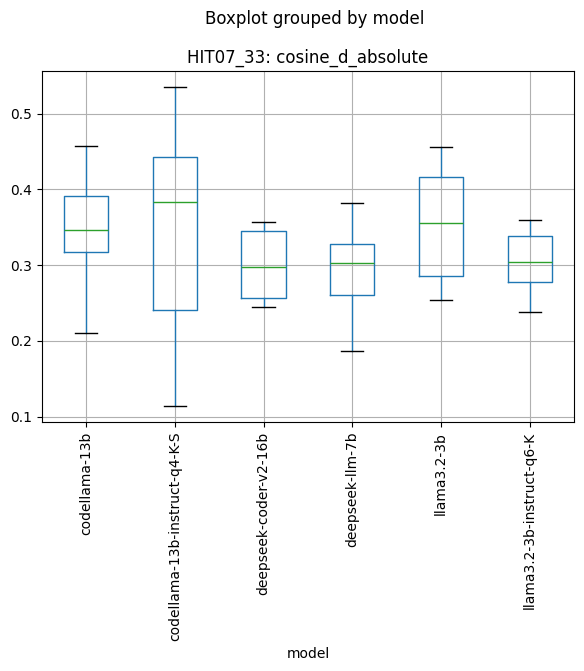

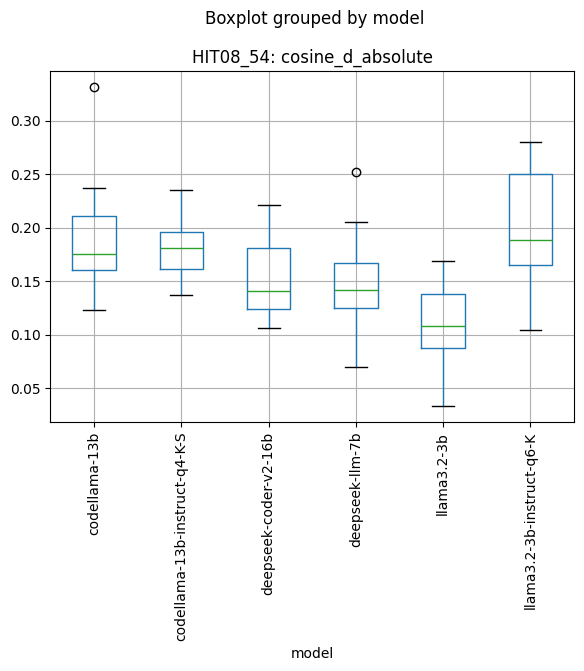

In [181]:
for m in metrics:
    for bug in df_dict:
        ax = df_dict[bug].boxplot(column=[m], by='model')
        plt.tight_layout()
        plt.xticks(rotation=90)
        plt.title(bug + ': ' + m)
        plt.show()

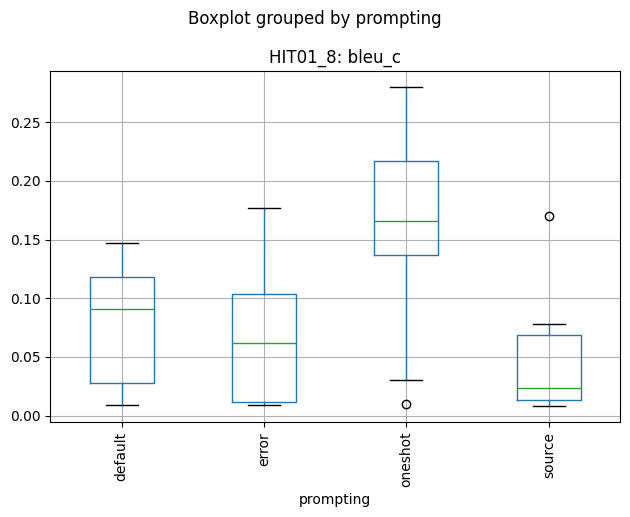

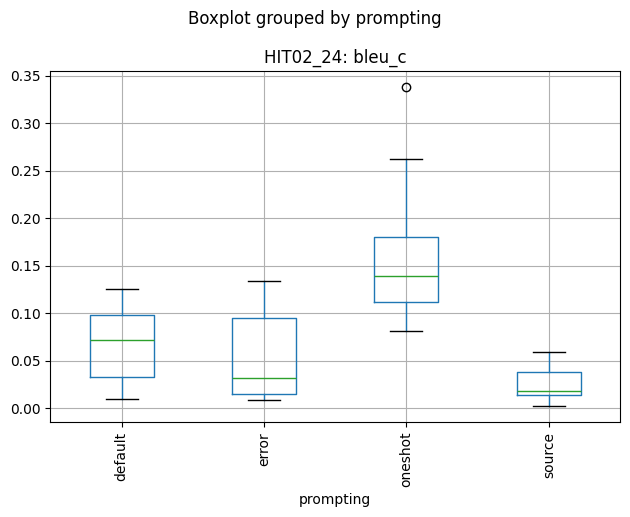

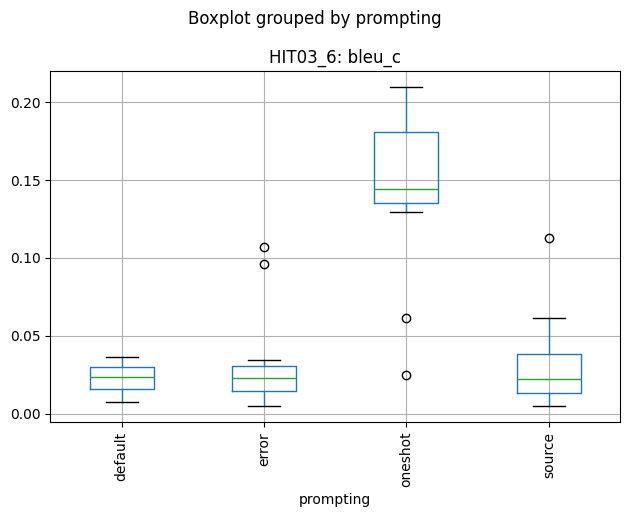

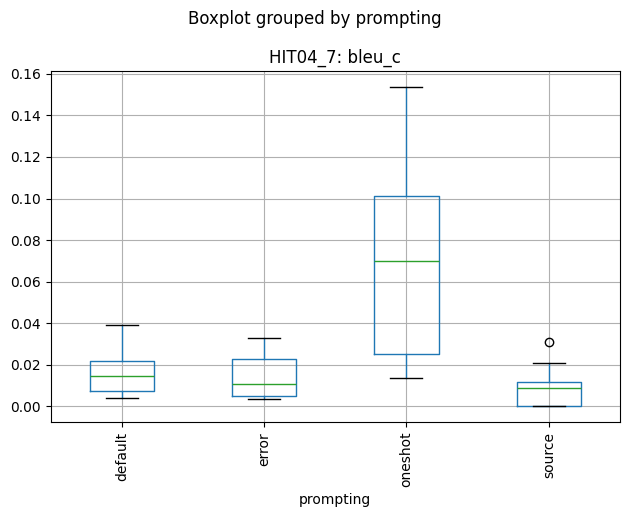

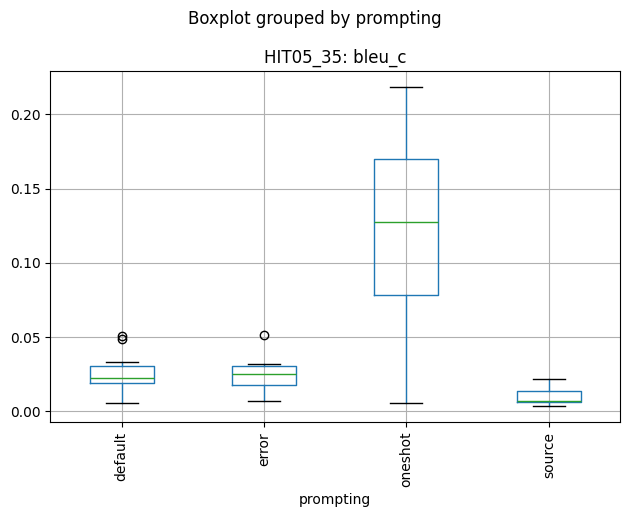

...

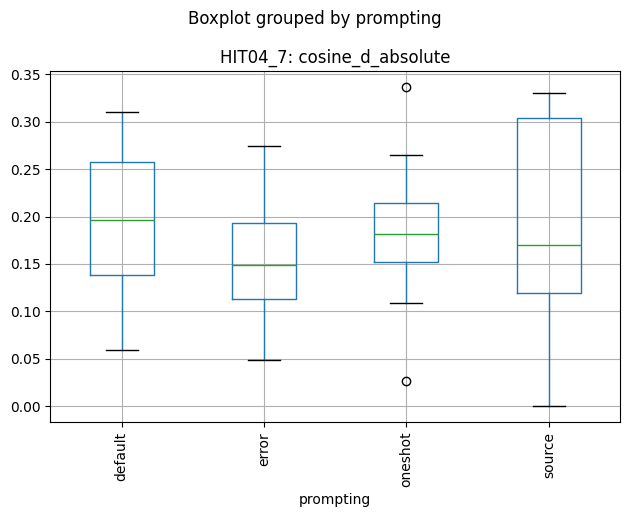

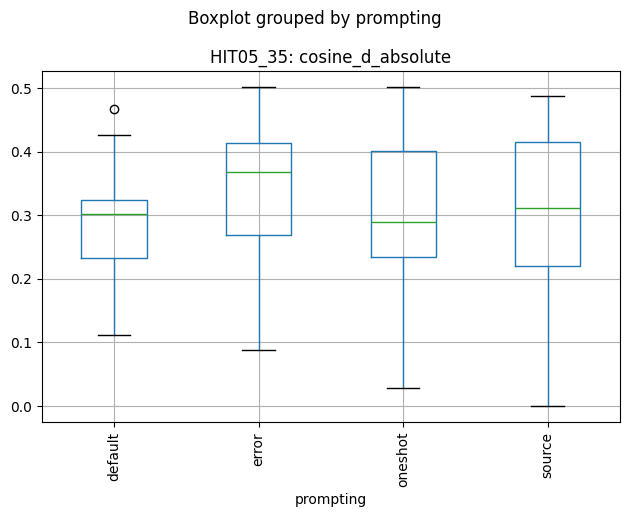

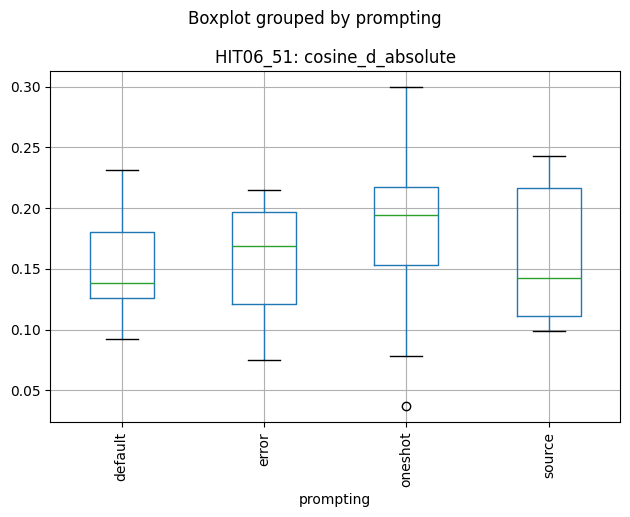

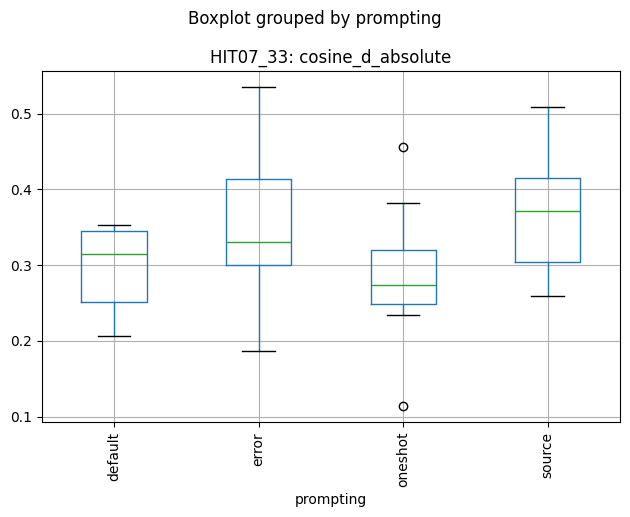

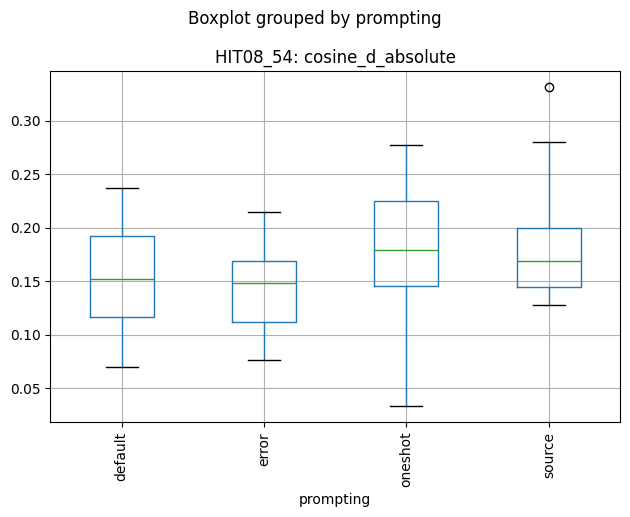

In [183]:
for m in metrics:
    for bug in df_dict:
        ax = df_dict[bug].boxplot(column=[m], by='prompting')
        plt.tight_layout()
        plt.xticks(rotation=90)
        plt.title(bug + ': ' + m)
        plt.show()

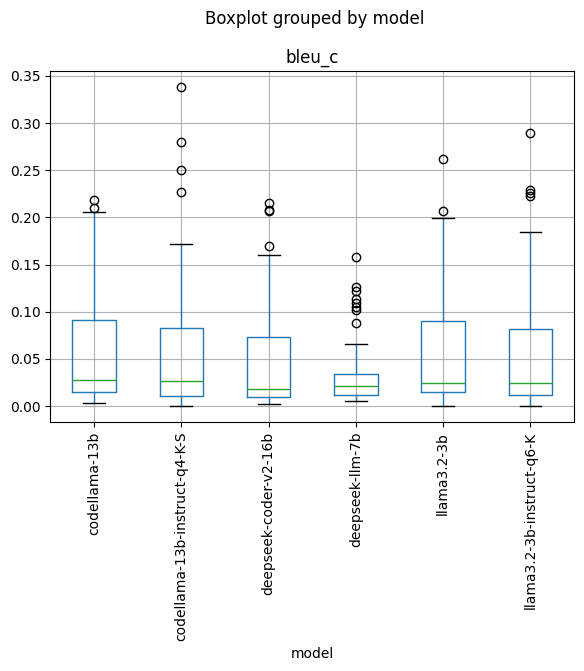

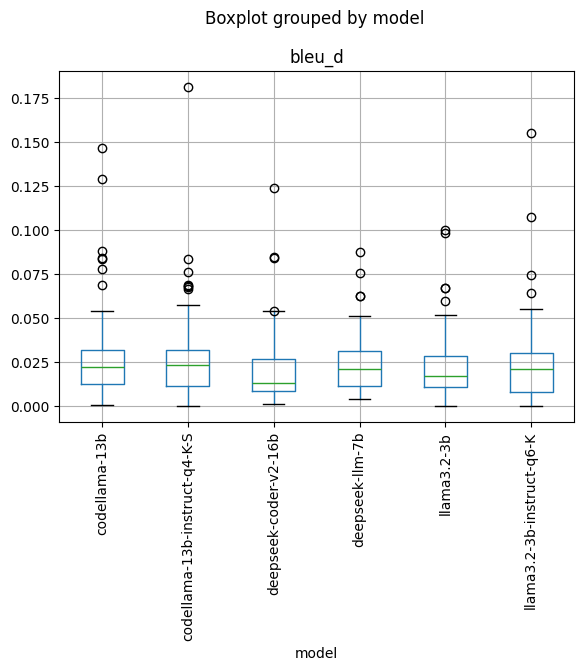

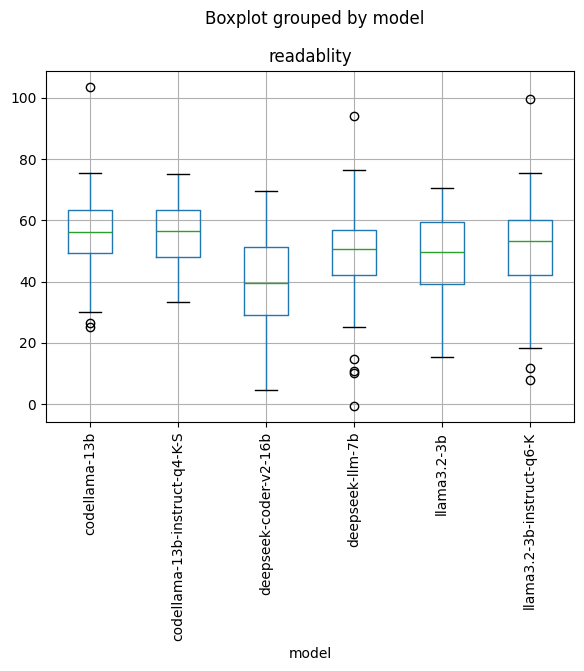

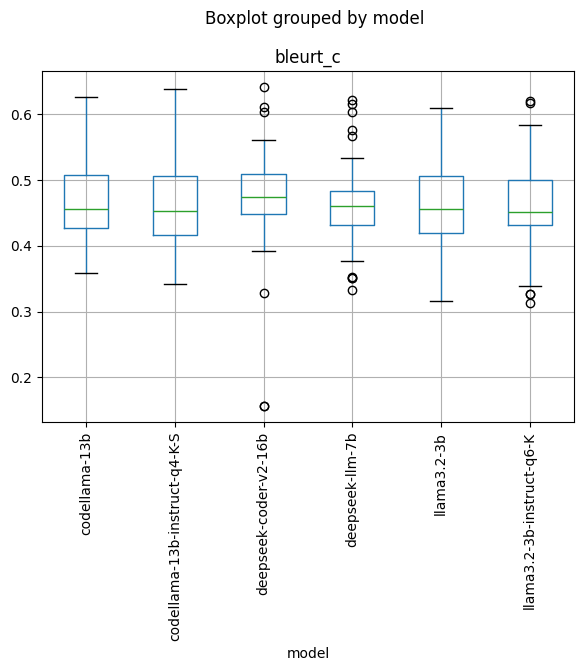

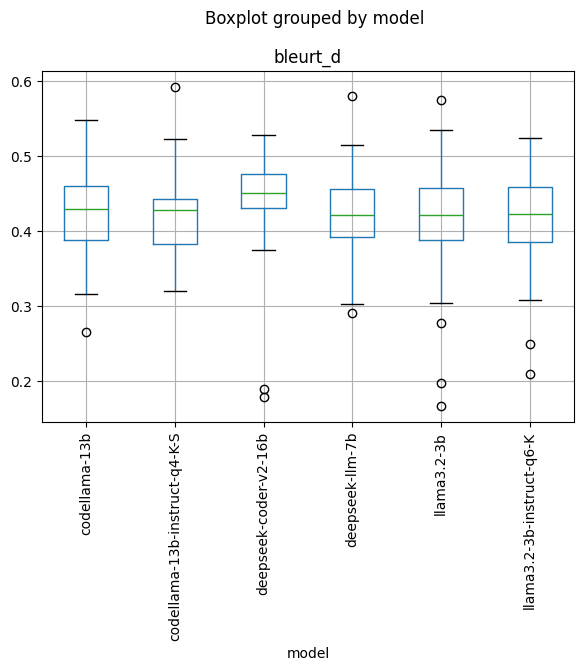

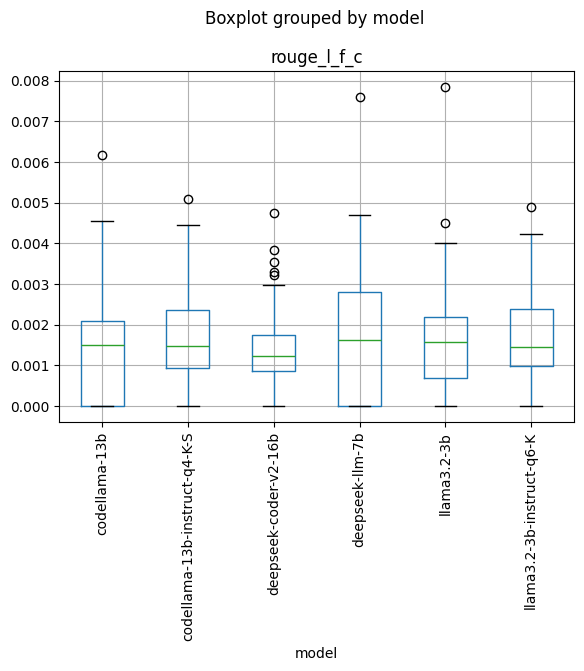

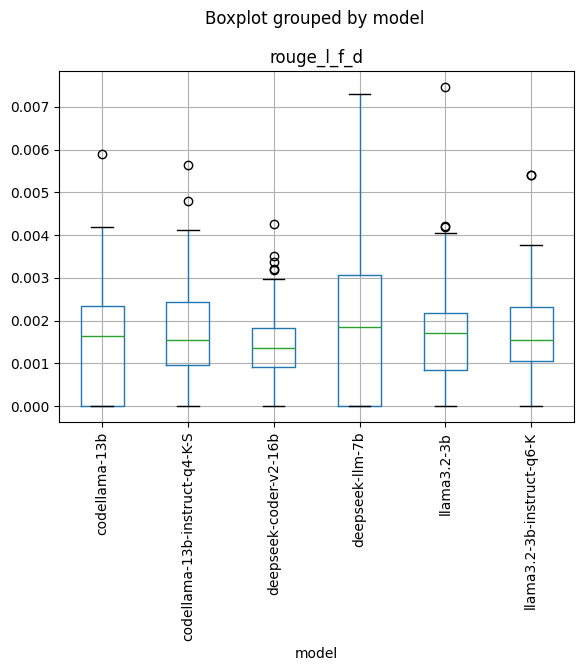

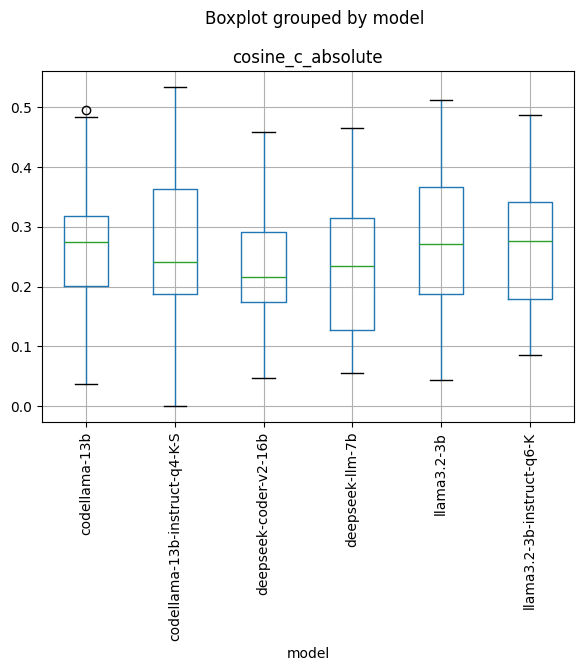

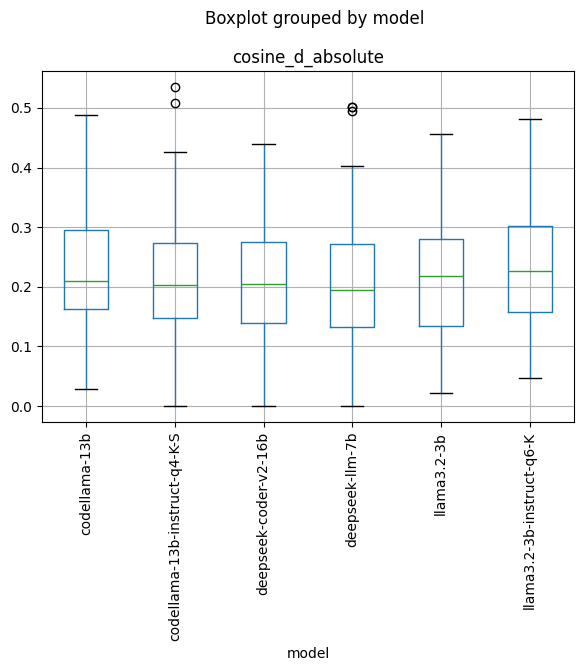

In [184]:
for m in metrics:
    ax = result_df.boxplot(column=[m], by='model')
    plt.tight_layout()
    plt.xticks(rotation=90)
    plt.show()

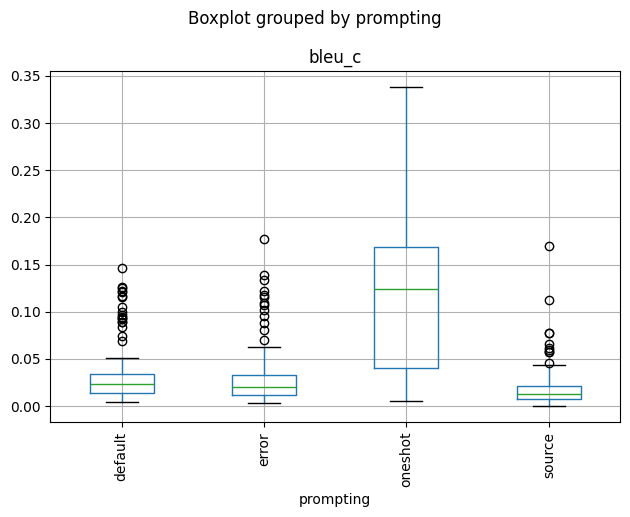

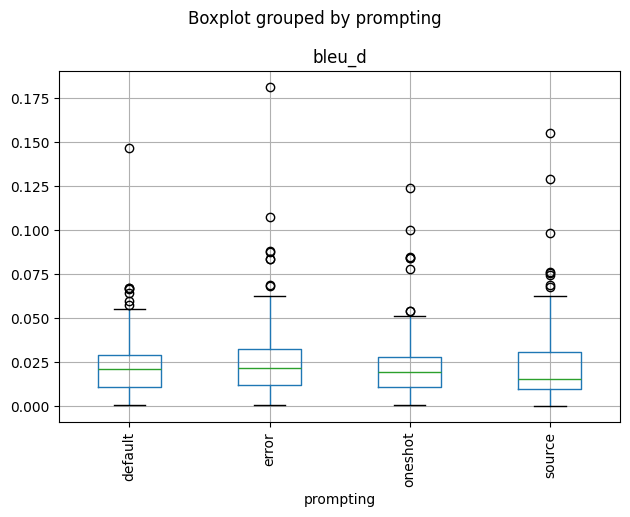

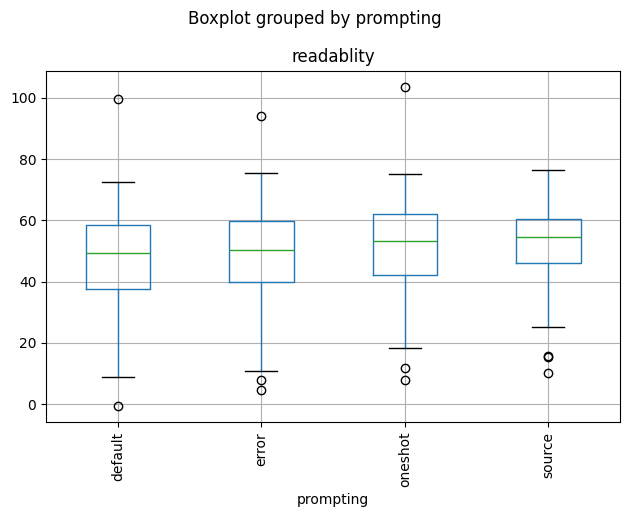

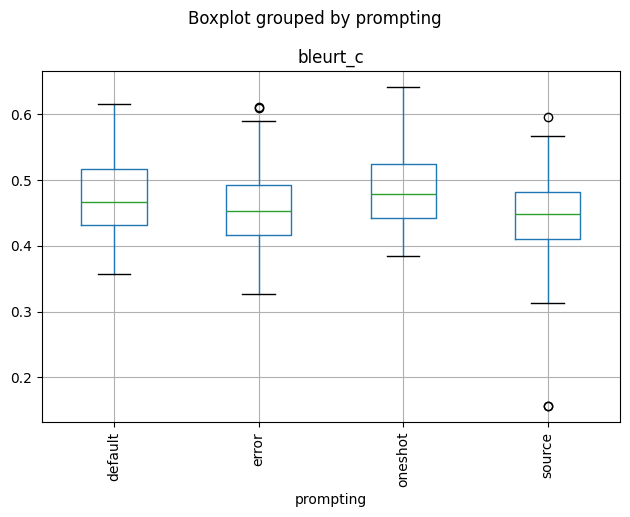

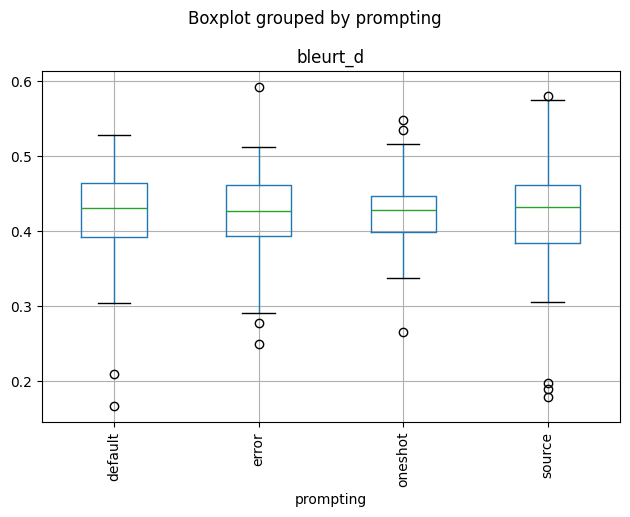

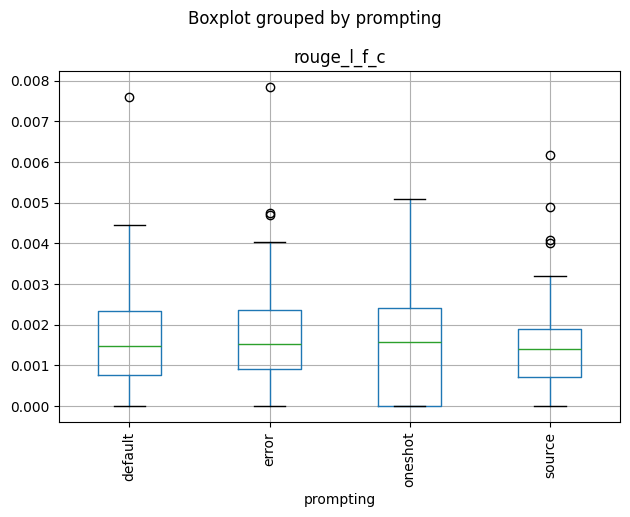

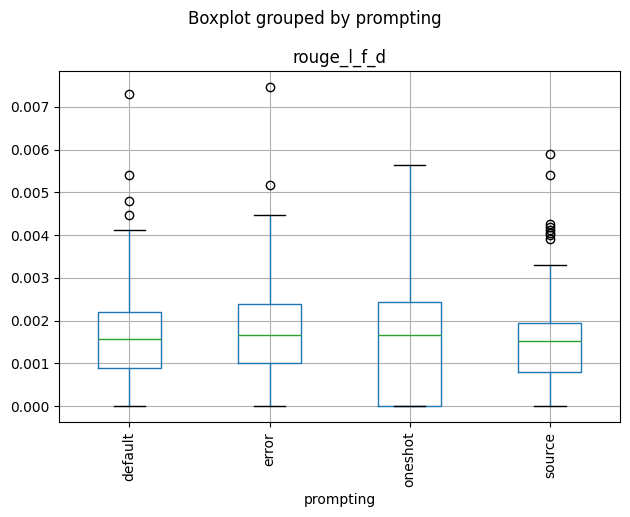

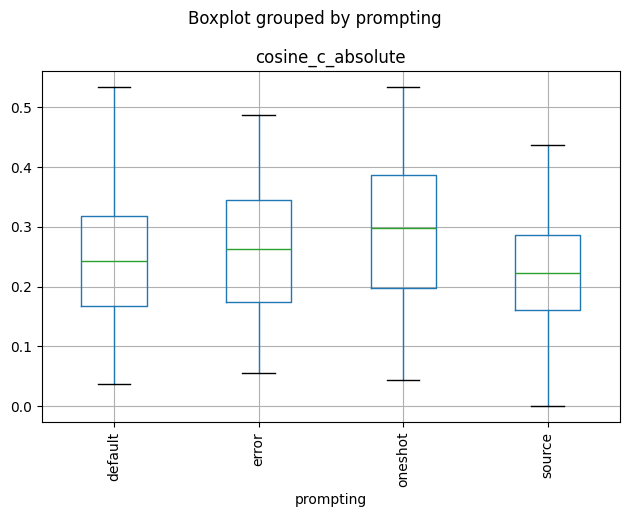

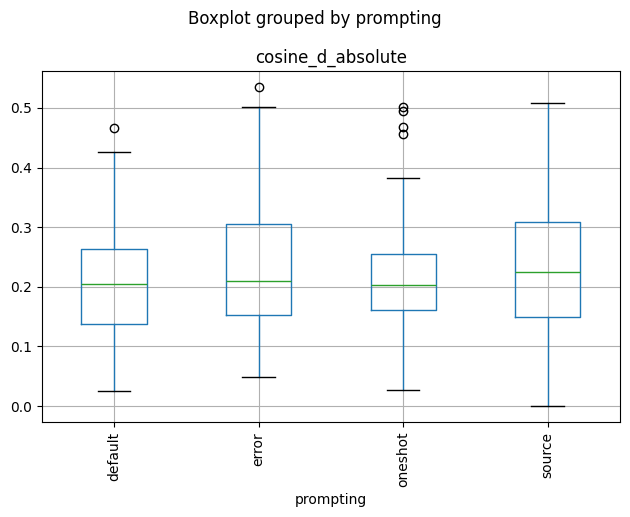

In [185]:
for m in metrics:
    ax = result_df.boxplot(column=[m], by='prompting')
    plt.tight_layout()
    plt.xticks(rotation=90)
    plt.show()

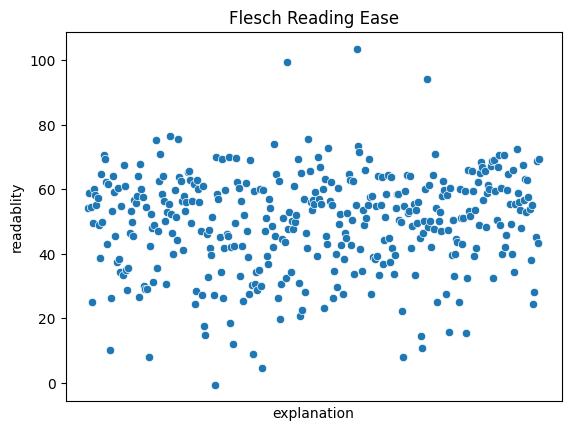

In [207]:
sns.scatterplot(data=result_df, x=result_df['explanation'], y=result_df['readablity'])
plt.xticks(ticks=[], rotation=90)
plt.title('Flesch Reading Ease')
plt.show()

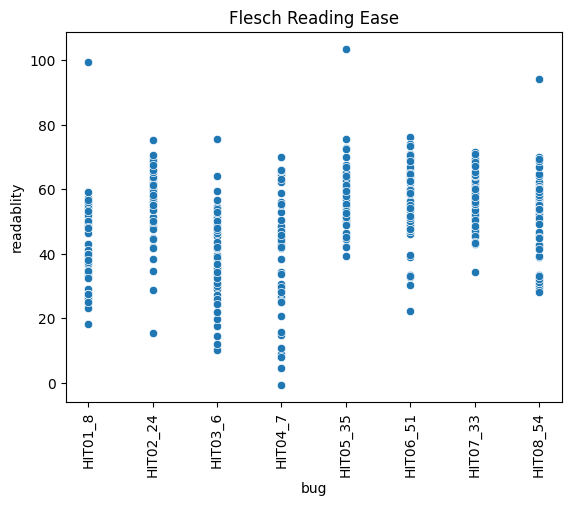

In [208]:
sns.scatterplot(data=result_df, x=result_df['bug'], y=result_df['readablity'])
plt.xticks(rotation=90)
plt.title('Flesch Reading Ease')
plt.show()

In [196]:
for m in metrics:
    print(m)
    print('Max: ' + str(max(result_df[m])))
    print('Min: ' + str(min(result_df[m])))
    print('Mean: ' + str(statistics.mean(result_df[m])))
    print('Median: ' + str(statistics.median(result_df[m])))

bleu_c
Max: 0.3384566388120849
Min: 6.315417232416361e-06
Mean: 0.05166624310814855
Median: 0.02427390536147825
bleu_d
Max: 0.1815326477052141
Min: 1.3179655137513374e-05
Mean: 0.025031580287858877
Median: 0.01878938053842065
readablity
Max: 103.63
Min: -0.61
Mean: 49.637760416666666
Median: 51.85
bleurt_c
Max: 0.6421604156494141
Min: 0.1561942994594574
Mean: 0.465291508163015
Median: 0.46036750078201294
bleurt_d
Max: 0.5928615927696228
Min: 0.1664581149816513
Mean: 0.42279969873682904
Median: 0.43049314618110657
rouge_l_f_c
Max: 0.007854934402941422
Min: 0.0
Mean: 0.001555880644067356
Median: 0.0014804370814240394
rouge_l_f_d
Max: 0.007468879668049792
Min: 0.0
Mean: 0.0016530624720309274
Median: 0.0015805252214635922
cosine_c_absolute
Max: 0.53445428
Min: 0.0
Mean: 0.25770456919270834
Median: 0.25495928999999995
cosine_d_absolute
Max: 0.53564924
Min: 0.0
Mean: 0.22114692888020834
Median: 0.20815718


In [198]:
for bug in df_dict:
    for m in metrics:
        print(bug)
        print(m)
        print('Max: ' + str(max(df_dict[bug][m])))
        print('Min: ' + str(min(df_dict[bug][m])))
        print('Mean: ' + str(statistics.mean(df_dict[bug][m])))
        print('Median: ' + str(statistics.median(df_dict[bug][m])))

HIT01_8
bleu_c
Max: 0.2802393958124026
Min: 0.0081116814351013
Mean: 0.08792197335301404
Median: 0.07754052857037186
HIT01_8
bleu_d
Max: 0.1238659623457237
Min: 0.0048897660722905
Mean: 0.03197725519101066
Median: 0.0289698223121094
HIT01_8
readablity
Max: 99.57
Min: 18.36
Mean: 41.819375
Median: 40.01
HIT01_8
bleurt_c
Max: 0.6050041913986206
Min: 0.3418672680854797
Mean: 0.4653438199311495
Median: 0.46844789385795593
HIT01_8
bleurt_d
Max: 0.5120632648468018
Min: 0.3202940821647644
Mean: 0.4258772041648626
Median: 0.42788630723953247
HIT01_8
rouge_l_f_c
Max: 0.002970410145093111
Min: 0.0
Mean: 0.0008380758666481294
Median: 0.0
HIT01_8
rouge_l_f_d
Max: 0.001972872996300863
Min: 0.0
Mean: 0.0005594843821000083
Median: 0.0
HIT01_8
cosine_c_absolute
Max: 0.53445428
Min: 0.13771858
Mean: 0.29477879979166666
Median: 0.28876910499999997
HIT01_8
cosine_d_absolute
Max: 0.45669275
Min: 0.07916302
Mean: 0.26531458916666667
Median: 0.27915764
HIT02_24
bleu_c
Max: 0.3384566388120849
Min: 0.00216713

In [200]:
for strat in result_df['prompting'].unique():
    for m in metrics:
        temp_df = result_df[result_df['prompting'] == strat]
        print(strat)
        print(m)
        print('Max: ' + str(max(temp_df[m])))
        print('Min: ' + str(min(temp_df[m])))
        print('Mean: ' + str(statistics.mean(temp_df[m])))
        print('Median: ' + str(statistics.median(temp_df[m])))

oneshot
bleu_c
Max: 0.3384566388120849
Min: 0.0053107552452949
Mean: 0.1169998434617274
Median: 0.1242119768120564
oneshot
bleu_d
Max: 0.1238659623457237
Min: 0.0008112163180396
Mean: 0.024528024334381428
Median: 0.01931045628643025
oneshot
readablity
Max: 103.63
Min: 7.86
Mean: 50.815729166666664
Median: 53.36
oneshot
bleurt_c
Max: 0.6421604156494141
Min: 0.3849764168262481
Mean: 0.48858879910161096
Median: 0.47926375269889826
oneshot
bleurt_d
Max: 0.5479196906089783
Min: 0.265148401260376
Mean: 0.4225849714130163
Median: 0.42867720127105713
oneshot
rouge_l_f_c
Max: 0.0051009564293305
Min: 0.0
Mean: 0.001536539387945991
Median: 0.0015857464083948744
oneshot
rouge_l_f_d
Max: 0.005629838142153413
Min: 0.0
Mean: 0.0016477331671981557
Median: 0.001656389983187428
oneshot
cosine_c_absolute
Max: 0.53320748
Min: 0.04439795
Mean: 0.29454358479166665
Median: 0.297909955
oneshot
cosine_d_absolute
Max: 0.50164068
Min: 0.02631838
Mean: 0.21376608395833332
Median: 0.203456825
source
bleu_c
Max: 0.

In [201]:
for model in result_df['model'].unique():
    for m in metrics:
        temp_df = result_df[result_df['prompting'] == strat]
        print(strat)
        print(m)
        print('Max: ' + str(max(temp_df[m])))
        print('Min: ' + str(min(temp_df[m])))
        print('Mean: ' + str(statistics.mean(temp_df[m])))
        print('Median: ' + str(statistics.median(temp_df[m])))

error
bleu_c
Max: 0.1771423018461558
Min: 0.0035314766372851
Mean: 0.032883005689844765
Median: 0.020159371447914298
error
bleu_d
Max: 0.1815326477052141
Min: 0.0007568878659587
Mean: 0.027806629185077338
Median: 0.02193439924231365
error
readablity
Max: 94.15
Min: 4.61
Mean: 48.371249999999996
Median: 50.295
error
bleurt_c
Max: 0.6118252277374268
Min: 0.3265432119369507
Mean: 0.45697809755802155
Median: 0.4524721205234527
error
bleurt_d
Max: 0.5928615927696228
Min: 0.249568834900856
Mean: 0.4233913373512526
Median: 0.42741820216178894
error
rouge_l_f_c
Max: 0.007854934402941422
Min: 0.0
Mean: 0.0016709362430647398
Median: 0.0015335791594192193
error
rouge_l_f_d
Max: 0.007468879668049792
Min: 0.0
Mean: 0.0017498488087941695
Median: 0.0016558559175405066
error
cosine_c_absolute
Max: 0.48713293
Min: 0.05531868
Mean: 0.2613510292708333
Median: 0.262390855
error
cosine_d_absolute
Max: 0.53564924
Min: 0.04888784
Mean: 0.233024968125
Median: 0.210378935
error
bleu_c
Max: 0.1771423018461558
M